In [1]:
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import os

os.chdir('Prueba simplificada-20200926T014032Z-001/Prueba simplificada')

In [2]:
df_test_small       = pd.read_csv('df_[test]_small.csv',sep=',')
df_town_state_small = pd.read_csv('town_state_small.csv',sep=',')
df_cliente_tabla    = pd.read_csv('cliente_tabla.csv',sep=',')
df_candid_small     = pd.read_csv('df_[candidate]_small.csv',sep=',')
df_prod_tabla       = pd.read_csv('producto_tabla.csv',sep=',')

In [3]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil
1181016,3,1139,7,3302,4512563,141,10,139.6,0,0.0,10


In [4]:
df_candid_small.shape

(7974418, 11)

In [5]:
df_candid_small["n"] = 1

In [8]:
df_candid_small[["Cliente_ID","Producto_ID","Agencia_ID","Semana","Ruta_SAK","n"]].groupby(["Cliente_ID","Producto_ID","Agencia_ID","Semana","Ruta_SAK"]).count()

n
Cliente_ID Producto_ID Agencia_ID Semana Ruta_SAK   
3967       303         1117       3      1606      1
                                  4      1606      1
           323         1117       3      1606      1
                                  4      1606      1
                                  7      1606      1
...                                               ..
99999999   43285       1129       5      600       1
           43341       1129       5      600       1
           43342       1129       3      600       1
           43356       1129       5      600       1
           44371       1129       3      600       1

[7974418 rows x 1 columns]

In [9]:
ls_dfs = [df_test_small,df_town_state_small,df_cliente_tabla,df_candid_small,df_prod_tabla]

In [10]:
i = 0
for df in ls_dfs:
    print(df.shape,'----',i)
    display(df.isnull().sum().to_frame()/len(df),df.info())
    i+=1

(1337913, 6) ---- 0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1337913 entries, 0 to 1337912
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype
---  ------       --------------    -----
 0   Semana       1337913 non-null  int64
 1   Agencia_ID   1337913 non-null  int64
 2   Canal_ID     1337913 non-null  int64
 3   Ruta_SAK     1337913 non-null  int64
 4   Cliente_ID   1337913 non-null  int64
 5   Producto_ID  1337913 non-null  int64
dtypes: int64(6)
memory usage: 61.2 MB


,0
Semana,0.0
Agencia_ID,0.0
Canal_ID,0.0
Ruta_SAK,0.0
Cliente_ID,0.0
Producto_ID,0.0


None

(41, 3) ---- 1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41 entries, 0 to 40
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Agencia_ID  41 non-null     int64 
 1   Town        41 non-null     object
 2   State       41 non-null     object
dtypes: int64(1), object(2)
memory usage: 1.1+ KB


,0
Agencia_ID,0.0
Town,0.0
State,0.0


None

(935362, 2) ---- 2
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 935362 entries, 0 to 935361
Data columns (total 2 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Cliente_ID     935362 non-null  int64 
 1   NombreCliente  935362 non-null  object
dtypes: int64(1), object(1)
memory usage: 14.3+ MB


,0
Cliente_ID,0.0
NombreCliente,0.0


None

(7974418, 12) ---- 3
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7974418 entries, 0 to 7974417
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Semana             int64  
 1   Agencia_ID         int64  
 2   Canal_ID           int64  
 3   Ruta_SAK           int64  
 4   Cliente_ID         int64  
 5   Producto_ID        int64  
 6   Venta_uni_hoy      int64  
 7   Venta_hoy          float64
 8   Dev_uni_proxima    int64  
 9   Dev_proxima        float64
 10  Demanda_uni_equil  int64  
 11  n                  int64  
dtypes: float64(2), int64(10)
memory usage: 730.1 MB


,0
Semana,0.0
Agencia_ID,0.0
Canal_ID,0.0
Ruta_SAK,0.0
Cliente_ID,0.0
Producto_ID,0.0
Venta_uni_hoy,0.0
Venta_hoy,0.0
Dev_uni_proxima,0.0
Dev_proxima,0.0


None

(2592, 2) ---- 4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2592 entries, 0 to 2591
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Producto_ID     2592 non-null   int64 
 1   NombreProducto  2592 non-null   object
dtypes: int64(1), object(1)
memory usage: 40.6+ KB


,0
Producto_ID,0.0
NombreProducto,0.0


None

### Client ID and Names

In [11]:
df_cliente_tabla.shape

(935362, 2)

In [12]:
def limpiar_texto(x):
    x = x.replace("  "," ")
    return x

In [13]:
df_cliente_tabla["NombreCliente"] = list(map(lambda x: limpiar_texto(x),df_cliente_tabla["NombreCliente"]))

In [14]:
len(set(df_cliente_tabla.Cliente_ID.unique()))

930500

In [15]:
ls_dfs = []

In [13]:
for aidi in df_cliente_tabla.Cliente_ID.unique():
    df_aux = df_cliente_tabla[df_cliente_tabla.Cliente_ID==aidi].copy()
    print(i)
    if len(df_aux.NombreCliente.unique())>1:
        display(df_aux)
        ls_dfs.append(df_aux)
        print('-----------****')
    i+=1

5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279


1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158


3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770
3771
3772
3773
3774
3775
3776
3777
3778
3779
3780
3781
3782
3783
3784
3785
3786
3787
3788
3789
3790
3791
3792
3793
3794
3795
3796
3797
3798
3799
3800
3801
3802
3803
3804
3805
3806
3807
3808
3809
3810
3811
3812
3813
3814
3815
3816
3817
3818
3819
3820
3821
3822
3823
3824
3825
3826
3827
3828
3829
3830
3831
3832
3833
3834
3835
3836
3837
3838
3839


5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5468
5469
5470
5471
5472
5473
5474
5475
5476
5477
5478
5479
5480
5481
5482
5483
5484
5485
5486
5487
5488
5489
5490
5491
5492
5493
5494
5495
5496
5497
5498
5499
5500
5501
5502
5503
5504
5505
5506
5507
5508
5509
5510
5511
5512
5513
5514
5515
5516
5517
5518
5519
5520


6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7152
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188


8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756
8757
8758
8759
8760
8761
8762
8763
8764
8765
8766
8767
8768
8769
8770
8771
8772
8773
8774
8775
8776
8777
8778
8779
8780
8781
8782
8783
8784
8785
8786
8787
8788
8789
8790
8791
8792
8793
8794
8795
8796
8797
8798
8799
8800
8801
8802
8803
8804
8805
8806
8807
8808
8809
8810
8811
8812
8813
8814
8815
8816
8817
8818
8819
8820
8821
8822
8823
8824
8825
8826
8827
8828
8829
8830
8831
8832
8833
8834
8835
8836
8837
8838
8839
8840
8841
8842
8843
8844
8845
8846
8847
8848
8849
8850
8851
8852
8853
8854
8855
8856
8857
8858
8859
8860
8861
8862
8863
8864
8865
8866
8867
8868
8869
8870
8871
8872
8873
8874
8875
8876


10349
10350
10351
10352
10353
10354
10355
10356
10357
10358
10359
10360
10361
10362
10363
10364
10365
10366
10367
10368
10369
10370
10371
10372
10373
10374
10375
10376
10377
10378
10379
10380
10381
10382
10383
10384
10385
10386
10387
10388
10389
10390
10391
10392
10393
10394
10395
10396
10397
10398
10399
10400
10401
10402
10403
10404
10405
10406
10407
10408
10409
10410
10411
10412
10413
10414
10415
10416
10417
10418
10419
10420
10421
10422
10423
10424
10425
10426
10427
10428
10429
10430
10431
10432
10433
10434
10435
10436
10437
10438
10439
10440
10441
10442
10443
10444
10445
10446
10447
10448
10449
10450
10451
10452
10453
10454
10455
10456
10457
10458
10459
10460
10461
10462
10463
10464
10465
10466
10467
10468
10469
10470
10471
10472
10473
10474
10475
10476
10477
10478
10479
10480
10481
10482
10483
10484
10485
10486
10487
10488
10489
10490
10491
10492
10493
10494
10495
10496
10497
10498
10499
10500
10501
10502
10503
10504
10505
10506
10507
10508
10509
10510
10511
10512
10513
10514
1051

11724
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11737
11738
11739
11740
11741
11742
11743
11744
11745
11746
11747
11748
11749
11750
11751
11752
11753
11754
11755
11756
11757
11758
11759
11760
11761
11762
11763
11764
11765
11766
11767
11768
11769
11770
11771
11772
11773
11774
11775
11776
11777
11778
11779
11780
11781
11782
11783
11784
11785
11786
11787
11788
11789
11790
11791
11792
11793
11794
11795
11796
11797
11798
11799
11800
11801
11802
11803
11804
11805
11806
11807
11808
11809
11810
11811
11812
11813
11814
11815
11816
11817
11818
11819
11820
11821
11822
11823
11824
11825
11826
11827
11828
11829
11830
11831
11832
11833
11834
11835
11836
11837
11838
11839
11840
11841
11842
11843
11844
11845
11846
11847
11848
11849
11850
11851
11852
11853
11854
11855
11856
11857
11858
11859
11860
11861
11862
11863
11864
11865
11866
11867
11868
11869
11870
11871
11872
11873
11874
11875
11876
11877
11878
11879
11880
11881
11882
11883
11884
11885
11886
11887
11888
11889
1189

13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
13125
13126
13127
13128
13129
13130
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13180
13181
13182
13183
13184
13185
13186
13187
13188
13189
13190
13191
13192
13193
13194
13195
13196
13197
13198
13199
13200
13201
13202
13203
13204
13205
13206
13207
13208
13209
13210
13211
13212
13213
13214
13215
13216
13217
13218
13219
13220
13221
13222
13223
13224
13225
13226
13227
13228
13229
13230
13231
13232
13233
13234
13235
13236
13237
13238
13239
13240
13241
13242
13243
13244
13245
13246
13247
13248
13249
13250
13251
13252
13253
13254
13255
13256
13257
13258
13259
13260
1326

14478
14479
14480
14481
14482
14483
14484
14485
14486
14487
14488
14489
14490
14491
14492
14493
14494
14495
14496
14497
14498
14499
14500
14501
14502
14503
14504
14505
14506
14507
14508
14509
14510
14511
14512
14513
14514
14515
14516
14517
14518
14519
14520
14521
14522
14523
14524
14525
14526
14527
14528
14529
14530
14531
14532
14533
14534
14535
14536
14537
14538
14539
14540
14541
14542
14543
14544
14545
14546
14547
14548
14549
14550
14551
14552
14553
14554
14555
14556
14557
14558
14559
14560
14561
14562
14563
14564
14565
14566
14567
14568
14569
14570
14571
14572
14573
14574
14575
14576
14577
14578
14579
14580
14581
14582
14583
14584
14585
14586
14587
14588
14589
14590
14591
14592
14593
14594
14595
14596
14597
14598
14599
14600
14601
14602
14603
14604
14605
14606
14607
14608
14609
14610
14611
14612
14613
14614
14615
14616
14617
14618
14619
14620
14621
14622
14623
14624
14625
14626
14627
14628
14629
14630
14631
14632
14633
14634
14635
14636
14637
14638
14639
14640
14641
14642
14643
1464

15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
16006
16007
16008
16009
16010
16011
16012
16013
16014
16015
16016
16017
16018
16019
16020
16021
16022
1602

,Cliente_ID,NombreCliente
17635,45869,ESC SEC TEC NO 81
17636,45869,ESC SEC TEC NO 81


-----------****
17074
17075
17076
17077
17078
17079
17080
17081
17082
17083
17084
17085
17086
17087
17088
17089
17090
17091
17092
17093
17094
17095
17096
17097
17098
17099
17100
17101
17102
17103
17104
17105
17106
17107
17108
17109
17110
17111
17112
17113
17114
17115
17116
17117
17118
17119
17120
17121
17122
17123
17124
17125
17126
17127
17128
17129
17130
17131
17132
17133
17134
17135
17136
17137
17138
17139
17140
17141
17142
17143
17144
17145
17146
17147
17148
17149
17150
17151
17152
17153
17154
17155
17156
17157
17158
17159
17160
17161
17162
17163
17164
17165
17166
17167
17168
17169
17170
17171
17172
17173
17174
17175
17176
17177
17178
17179
17180
17181
17182
17183
17184
17185
17186
17187
17188
17189
17190
17191
17192
17193
17194
17195
17196
17197
17198
17199
17200
17201
17202
17203
17204
17205
17206
17207
17208
17209
17210
17211
17212
17213
17214
17215
17216
17217
17218
17219
17220
17221
17222
17223
17224
17225
17226
17227
17228
17229
17230
17231
17232
17233
17234
17235
17236
17237


18442
18443
18444
18445
18446
18447
18448
18449
18450
18451
18452
18453
18454
18455
18456
18457
18458
18459
18460
18461
18462
18463
18464
18465
18466
18467
18468
18469
18470
18471
18472
18473
18474
18475
18476
18477
18478
18479
18480
18481
18482
18483
18484
18485
18486
18487
18488
18489
18490
18491
18492
18493
18494
18495
18496
18497
18498
18499
18500
18501
18502
18503
18504
18505
18506
18507
18508
18509
18510
18511
18512
18513
18514
18515
18516
18517
18518
18519
18520
18521
18522
18523
18524
18525
18526
18527
18528
18529
18530
18531
18532
18533
18534
18535
18536
18537
18538
18539
18540
18541
18542
18543
18544
18545
18546
18547
18548
18549
18550
18551
18552
18553
18554
18555
18556
18557
18558
18559
18560
18561
18562
18563
18564
18565
18566
18567
18568
18569
18570
18571
18572
18573
18574
18575
18576
18577
18578
18579
18580
18581
18582
18583
18584
18585
18586
18587
18588
18589
18590
18591
18592
18593
18594
18595
18596
18597
18598
18599
18600
18601
18602
18603
18604
18605
18606
18607
1860

19808
19809
19810
19811
19812
19813
19814
19815
19816
19817
19818
19819
19820
19821
19822
19823
19824
19825
19826
19827
19828
19829
19830
19831
19832
19833
19834
19835
19836
19837
19838
19839
19840
19841
19842
19843
19844
19845
19846
19847
19848
19849
19850
19851
19852
19853
19854
19855
19856
19857
19858
19859
19860
19861
19862
19863
19864
19865
19866
19867
19868
19869
19870
19871
19872
19873
19874
19875
19876
19877
19878
19879
19880
19881
19882
19883
19884
19885
19886
19887
19888
19889
19890
19891
19892
19893
19894
19895
19896
19897
19898
19899
19900
19901
19902
19903
19904
19905
19906
19907
19908
19909
19910
19911
19912
19913
19914
19915
19916
19917
19918
19919
19920
19921
19922
19923
19924
19925
19926
19927
19928
19929
19930
19931
19932
19933
19934
19935
19936
19937
19938
19939
19940
19941
19942
19943
19944
19945
19946
19947
19948
19949
19950
19951
19952
19953
19954
19955
19956
19957
19958
19959
19960
19961
19962
19963
19964
19965
19966
19967
19968
19969
19970
19971
19972
19973
1997

21180
21181
21182
21183
21184
21185
21186
21187
21188
21189
21190
21191
21192
21193
21194
21195
21196
21197
21198
21199
21200
21201
21202
21203
21204
21205
21206
21207
21208
21209
21210
21211
21212
21213
21214
21215
21216
21217
21218
21219
21220
21221
21222
21223
21224
21225
21226
21227
21228
21229
21230
21231
21232
21233
21234
21235
21236
21237
21238
21239
21240
21241
21242
21243
21244
21245
21246
21247
21248
21249
21250
21251
21252
21253
21254
21255
21256
21257
21258
21259
21260
21261
21262
21263
21264
21265
21266
21267
21268
21269
21270
21271
21272
21273
21274
21275
21276
21277
21278
21279
21280
21281
21282
21283
21284
21285
21286
21287
21288
21289
21290
21291
21292
21293
21294
21295
21296
21297
21298
21299
21300
21301
21302
21303
21304
21305
21306
21307
21308
21309
21310
21311
21312
21313
21314
21315
21316
21317
21318
21319
21320
21321
21322
21323
21324
21325
21326
21327
21328
21329
21330
21331
21332
21333
21334
21335
21336
21337
21338
21339
21340
21341
21342
21343
21344
21345
2134

22686
22687
22688
22689
22690
22691
22692
22693
22694
22695
22696
22697
22698
22699
22700
22701
22702
22703
22704
22705
22706
22707
22708
22709
22710
22711
22712
22713
22714
22715
22716
22717
22718
22719
22720
22721
22722
22723
22724
22725
22726
22727
22728
22729
22730
22731
22732
22733
22734
22735
22736
22737
22738
22739
22740
22741
22742
22743
22744
22745
22746
22747
22748
22749
22750
22751
22752
22753
22754
22755
22756
22757
22758
22759
22760
22761
22762
22763
22764
22765
22766
22767
22768
22769
22770
22771
22772
22773
22774
22775
22776
22777
22778
22779
22780
22781
22782
22783
22784
22785
22786
22787
22788
22789
22790
22791
22792
22793
22794
22795
22796
22797
22798
22799
22800
22801
22802
22803
22804
22805
22806
22807
22808
22809
22810
22811
22812
22813
22814
22815
22816
22817
22818
22819
22820
22821
22822
22823
22824
22825
22826
22827
22828
22829
22830
22831
22832
22833
22834
22835
22836
22837
22838
22839
22840
22841
22842
22843
22844
22845
22846
22847
22848
22849
22850
22851
2285

24053
24054
24055
24056
24057
24058
24059
24060
24061
24062
24063
24064
24065
24066
24067
24068
24069
24070
24071
24072
24073
24074
24075
24076
24077
24078
24079
24080
24081
24082
24083
24084
24085
24086
24087
24088
24089
24090
24091
24092
24093
24094
24095
24096
24097
24098
24099
24100
24101
24102
24103
24104
24105
24106
24107
24108
24109
24110
24111
24112
24113
24114
24115
24116
24117
24118
24119
24120
24121
24122
24123
24124
24125
24126
24127
24128
24129
24130
24131
24132
24133
24134
24135
24136
24137
24138
24139
24140
24141
24142
24143
24144
24145
24146
24147
24148
24149
24150
24151
24152
24153
24154
24155
24156
24157
24158
24159
24160
24161
24162
24163
24164
24165
24166
24167
24168
24169
24170
24171
24172
24173
24174
24175
24176
24177
24178
24179
24180
24181
24182
24183
24184
24185
24186
24187
24188
24189
24190
24191
24192
24193
24194
24195
24196
24197
24198
24199
24200
24201
24202
24203
24204
24205
24206
24207
24208
24209
24210
24211
24212
24213
24214
24215
24216
24217
24218
2421

25562
25563
25564
25565
25566
25567
25568
25569
25570
25571
25572
25573
25574
25575
25576
25577
25578
25579
25580
25581
25582
25583
25584
25585
25586
25587
25588
25589
25590
25591
25592
25593
25594
25595
25596
25597
25598
25599
25600
25601
25602
25603
25604
25605
25606
25607
25608
25609
25610
25611
25612
25613
25614
25615
25616
25617
25618
25619
25620
25621
25622
25623
25624
25625
25626
25627
25628
25629
25630
25631
25632
25633
25634
25635
25636
25637
25638
25639
25640
25641
25642
25643
25644
25645
25646
25647
25648
25649
25650
25651
25652
25653
25654
25655
25656
25657
25658
25659
25660
25661
25662
25663
25664
25665
25666
25667
25668
25669
25670
25671
25672
25673
25674
25675
25676
25677
25678
25679
25680
25681
25682
25683
25684
25685
25686
25687
25688
25689
25690
25691
25692
25693
25694
25695
25696
25697
25698
25699
25700
25701
25702
25703
25704
25705
25706
25707
25708
25709
25710
25711
25712
25713
25714
25715
25716
25717
25718
25719
25720
25721
25722
25723
25724
25725
25726
25727
2572

26930
26931
26932
26933
26934
26935
26936
26937
26938
26939
26940
26941
26942
26943
26944
26945
26946
26947
26948
26949
26950
26951
26952
26953
26954
26955
26956
26957
26958
26959
26960
26961
26962
26963
26964
26965
26966
26967
26968
26969
26970
26971
26972
26973
26974
26975
26976
26977
26978
26979
26980
26981
26982
26983
26984
26985
26986
26987
26988
26989
26990
26991
26992
26993
26994
26995
26996
26997
26998
26999
27000
27001
27002
27003
27004
27005
27006
27007
27008
27009
27010
27011
27012
27013
27014
27015
27016
27017
27018
27019
27020
27021
27022
27023
27024
27025
27026
27027
27028
27029
27030
27031
27032
27033
27034
27035
27036
27037
27038
27039
27040
27041
27042
27043
27044
27045
27046
27047
27048
27049
27050
27051
27052
27053
27054
27055
27056
27057
27058
27059
27060
27061
27062
27063
27064
27065
27066
27067
27068
27069
27070
27071
27072
27073
27074
27075
27076
27077
27078
27079
27080
27081
27082
27083
27084
27085
27086
27087
27088
27089
27090
27091
27092
27093
27094
27095
2709

28296
28297
28298
28299
28300
28301
28302
28303
28304
28305
28306
28307
28308
28309
28310
28311
28312
28313
28314
28315
28316
28317
28318
28319
28320
28321
28322
28323
28324
28325
28326
28327
28328
28329
28330
28331
28332
28333
28334
28335
28336
28337
28338
28339
28340
28341
28342
28343
28344
28345
28346
28347
28348
28349
28350
28351
28352
28353
28354
28355
28356
28357
28358
28359
28360
28361
28362
28363
28364
28365
28366
28367
28368
28369
28370
28371
28372
28373
28374
28375
28376
28377
28378
28379
28380
28381
28382
28383
28384
28385
28386
28387
28388
28389
28390
28391
28392
28393
28394
28395
28396
28397
28398
28399
28400
28401
28402
28403
28404
28405
28406
28407
28408
28409
28410
28411
28412
28413
28414
28415
28416
28417
28418
28419
28420
28421
28422
28423
28424
28425
28426
28427
28428
28429
28430
28431
28432
28433
28434
28435
28436
28437
28438
28439
28440
28441
28442
28443
28444
28445
28446
28447
28448
28449
28450
28451
28452
28453
28454
28455
28456
28457
28458
28459
28460
28461
2846

29799
29800
29801
29802
29803
29804
29805
29806
29807
29808
29809
29810
29811
29812
29813
29814
29815
29816
29817
29818
29819
29820
29821
29822
29823
29824
29825
29826
29827
29828
29829
29830
29831
29832
29833
29834
29835
29836
29837
29838
29839
29840
29841
29842
29843
29844
29845
29846
29847
29848
29849
29850
29851
29852
29853
29854
29855
29856
29857
29858
29859
29860
29861
29862
29863
29864
29865
29866
29867
29868
29869
29870
29871
29872
29873
29874
29875
29876
29877
29878
29879
29880
29881
29882
29883
29884
29885
29886
29887
29888
29889
29890
29891
29892
29893
29894
29895
29896
29897
29898
29899
29900
29901
29902
29903
29904
29905
29906
29907
29908
29909
29910
29911
29912
29913
29914
29915
29916
29917
29918
29919
29920
29921
29922
29923
29924
29925
29926
29927
29928
29929
29930
29931
29932
29933
29934
29935
29936
29937
29938
29939
29940
29941
29942
29943
29944
29945
29946
29947
29948
29949
29950
29951
29952
29953
29954
29955
29956
29957
29958
29959
29960
29961
29962
29963
29964
2996

31176
31177
31178
31179
31180
31181
31182
31183
31184
31185
31186
31187
31188
31189
31190
31191
31192
31193
31194
31195
31196
31197
31198
31199
31200
31201
31202
31203
31204
31205
31206
31207
31208
31209
31210
31211
31212
31213
31214
31215
31216
31217
31218
31219
31220
31221
31222
31223
31224
31225
31226
31227
31228
31229
31230
31231
31232
31233
31234
31235
31236
31237
31238
31239
31240
31241
31242
31243
31244
31245
31246
31247
31248
31249
31250
31251
31252
31253
31254
31255
31256
31257
31258
31259
31260
31261
31262
31263
31264
31265
31266
31267
31268
31269
31270
31271
31272
31273
31274
31275
31276
31277
31278
31279
31280
31281
31282
31283
31284
31285
31286
31287
31288
31289
31290
31291
31292
31293
31294
31295
31296
31297
31298
31299
31300
31301
31302
31303
31304
31305
31306
31307
31308
31309
31310
31311
31312
31313
31314
31315
31316
31317
31318
31319
31320
31321
31322
31323
31324
31325
31326
31327
31328
31329
31330
31331
31332
31333
31334
31335
31336
31337
31338
31339
31340
31341
3134

32545
32546
32547
32548
32549
32550
32551
32552
32553
32554
32555
32556
32557
32558
32559
32560
32561
32562
32563
32564
32565
32566
32567
32568
32569
32570
32571
32572
32573
32574
32575
32576
32577
32578
32579
32580
32581
32582
32583
32584
32585
32586
32587
32588
32589
32590
32591
32592
32593
32594
32595
32596
32597
32598
32599
32600
32601
32602
32603
32604
32605
32606
32607
32608
32609
32610
32611
32612
32613
32614
32615
32616
32617
32618
32619
32620
32621
32622
32623
32624
32625
32626
32627
32628
32629
32630
32631
32632
32633
32634
32635
32636
32637
32638
32639
32640
32641
32642
32643
32644
32645
32646
32647
32648
32649
32650
32651
32652
32653
32654
32655
32656
32657
32658
32659
32660
32661
32662
32663
32664
32665
32666
32667
32668
32669
32670
32671
32672
32673
32674
32675
32676
32677
32678
32679
32680
32681
32682
32683
32684
32685
32686
32687
32688
32689
32690
32691
32692
32693
32694
32695
32696
32697
32698
32699
32700
32701
32702
32703
32704
32705
32706
32707
32708
32709
32710
3271

34027
34028
34029
34030
34031
34032
34033
34034
34035
34036
34037
34038
34039
34040
34041
34042
34043
34044
34045
34046
34047
34048
34049
34050
34051
34052
34053
34054
34055
34056
34057
34058
34059
34060
34061
34062
34063
34064
34065
34066
34067
34068
34069
34070
34071
34072
34073
34074
34075
34076
34077
34078
34079
34080
34081
34082
34083
34084
34085
34086
34087
34088
34089
34090
34091
34092
34093
34094
34095
34096
34097
34098
34099
34100
34101
34102
34103
34104
34105
34106
34107
34108
34109
34110
34111
34112
34113
34114
34115
34116
34117
34118
34119
34120
34121
34122
34123
34124
34125
34126
34127
34128
34129
34130
34131
34132
34133
34134
34135
34136
34137
34138
34139
34140
34141
34142
34143
34144
34145
34146
34147
34148
34149
34150
34151
34152
34153
34154
34155
34156
34157
34158
34159
34160
34161
34162
34163
34164
34165
34166
34167
34168
34169
34170
34171
34172
34173
34174
34175
34176
34177
34178
34179
34180
34181
34182
34183
34184
34185
34186
34187
34188
34189
34190
34191
34192
3419

35400
35401
35402
35403
35404
35405
35406
35407
35408
35409
35410
35411
35412
35413
35414
35415
35416
35417
35418
35419
35420
35421
35422
35423
35424
35425
35426
35427
35428
35429
35430
35431
35432
35433
35434
35435
35436
35437
35438
35439
35440
35441
35442
35443
35444
35445
35446
35447
35448
35449
35450
35451
35452
35453
35454
35455
35456
35457
35458
35459
35460
35461
35462
35463
35464
35465
35466
35467
35468
35469
35470
35471
35472
35473
35474
35475
35476
35477
35478
35479
35480
35481
35482
35483
35484
35485
35486
35487
35488
35489
35490
35491
35492
35493
35494
35495
35496
35497
35498
35499
35500
35501
35502
35503
35504
35505
35506
35507
35508
35509
35510
35511
35512
35513
35514
35515
35516
35517
35518
35519
35520
35521
35522
35523
35524
35525
35526
35527
35528
35529
35530
35531
35532
35533
35534
35535
35536
35537
35538
35539
35540
35541
35542
35543
35544
35545
35546
35547
35548
35549
35550
35551
35552
35553
35554
35555
35556
35557
35558
35559
35560
35561
35562
35563
35564
35565
3556

36898
36899
36900
36901
36902
36903
36904
36905
36906
36907
36908
36909
36910
36911
36912
36913
36914
36915
36916
36917
36918
36919
36920
36921
36922
36923
36924
36925
36926
36927
36928
36929
36930
36931
36932
36933
36934
36935
36936
36937
36938
36939
36940
36941
36942
36943
36944
36945
36946
36947
36948
36949
36950
36951
36952
36953
36954
36955
36956
36957
36958
36959
36960
36961
36962
36963
36964
36965
36966
36967
36968
36969
36970
36971
36972
36973
36974
36975
36976
36977
36978
36979
36980
36981
36982
36983
36984
36985
36986
36987
36988
36989
36990
36991
36992
36993
36994
36995
36996
36997
36998
36999
37000
37001
37002
37003
37004
37005
37006
37007
37008
37009
37010
37011
37012
37013
37014
37015
37016
37017
37018
37019
37020
37021
37022
37023
37024
37025
37026
37027
37028
37029
37030
37031
37032
37033
37034
37035
37036
37037
37038
37039
37040
37041
37042
37043
37044
37045
37046
37047
37048
37049
37050
37051
37052
37053
37054
37055
37056
37057
37058
37059
37060
37061
37062
37063
3706

38277
38278
38279
38280
38281
38282
38283
38284
38285
38286
38287
38288
38289
38290
38291
38292
38293
38294
38295
38296
38297
38298
38299
38300
38301
38302
38303
38304
38305
38306
38307
38308
38309
38310
38311
38312
38313
38314
38315
38316
38317
38318
38319
38320
38321
38322
38323
38324
38325
38326
38327
38328
38329
38330
38331
38332
38333
38334
38335
38336
38337
38338
38339
38340
38341
38342
38343
38344
38345
38346
38347
38348
38349
38350
38351
38352
38353
38354
38355
38356
38357
38358
38359
38360
38361
38362
38363
38364
38365
38366
38367
38368
38369
38370
38371
38372
38373
38374
38375
38376
38377
38378
38379
38380
38381
38382
38383
38384
38385
38386
38387
38388
38389
38390
38391
38392
38393
38394
38395
38396
38397
38398
38399
38400
38401
38402
38403
38404
38405
38406
38407
38408
38409
38410
38411
38412
38413
38414
38415
38416
38417
38418
38419
38420
38421
38422
38423
38424
38425
38426
38427
38428
38429
38430
38431
38432
38433
38434
38435
38436
38437
38438
38439
38440
38441
38442
3844

39758
39759
39760
39761
39762
39763
39764
39765
39766
39767
39768
39769
39770
39771
39772
39773
39774
39775
39776
39777
39778
39779
39780
39781
39782
39783
39784
39785
39786
39787
39788
39789
39790
39791
39792
39793
39794
39795
39796
39797
39798
39799
39800
39801
39802
39803
39804
39805
39806
39807
39808
39809
39810
39811
39812
39813
39814
39815
39816
39817
39818
39819
39820
39821
39822
39823
39824
39825
39826
39827
39828
39829
39830
39831
39832
39833
39834
39835
39836
39837
39838
39839
39840
39841
39842
39843
39844
39845
39846
39847
39848
39849
39850
39851
39852
39853
39854
39855
39856
39857
39858
39859
39860
39861
39862
39863
39864
39865
39866
39867
39868
39869
39870
39871
39872
39873
39874
39875
39876
39877
39878
39879
39880
39881
39882
39883
39884
39885
39886
39887
39888
39889
39890
39891
39892
39893
39894
39895
39896
39897
39898
39899
39900
39901
39902
39903
39904
39905
39906
39907
39908
39909
39910
39911
39912
39913
39914
39915
39916
39917
39918
39919
39920
39921
39922
39923
3992

41124
41125
41126
41127
41128
41129
41130
41131
41132
41133
41134
41135
41136
41137
41138
41139
41140
41141
41142
41143
41144
41145
41146
41147
41148
41149
41150
41151
41152
41153
41154
41155
41156
41157
41158
41159
41160
41161
41162
41163
41164
41165
41166
41167
41168
41169
41170
41171
41172
41173
41174
41175
41176
41177
41178
41179
41180
41181
41182
41183
41184
41185
41186
41187
41188
41189
41190
41191
41192
41193
41194
41195
41196
41197
41198
41199
41200
41201
41202
41203
41204
41205
41206
41207
41208
41209
41210
41211
41212
41213
41214
41215
41216
41217
41218
41219
41220
41221
41222
41223
41224
41225
41226
41227
41228
41229
41230
41231
41232
41233
41234
41235
41236
41237
41238
41239
41240
41241
41242
41243
41244
41245
41246
41247
41248
41249
41250
41251
41252
41253
41254
41255
41256
41257
41258
41259
41260
41261
41262
41263
41264
41265
41266
41267
41268
41269
41270
41271
41272
41273
41274
41275
41276
41277
41278
41279
41280
41281
41282
41283
41284
41285
41286
41287
41288
41289
4129

42493
42494
42495
42496
42497
42498
42499
42500
42501
42502
42503
42504
42505
42506
42507
42508
42509
42510
42511
42512
42513
42514
42515
42516
42517
42518
42519
42520
42521
42522
42523
42524
42525
42526
42527
42528
42529
42530
42531
42532
42533
42534
42535
42536
42537
42538
42539
42540
42541
42542
42543
42544
42545
42546
42547
42548
42549
42550
42551
42552
42553
42554
42555
42556
42557
42558
42559
42560
42561
42562
42563
42564
42565
42566
42567
42568
42569
42570
42571
42572
42573
42574
42575
42576
42577
42578
42579
42580
42581
42582
42583
42584
42585
42586
42587
42588
42589
42590
42591
42592
42593
42594
42595
42596
42597
42598
42599
42600
42601
42602
42603
42604
42605
42606
42607
42608
42609
42610
42611
42612
42613
42614
42615
42616
42617
42618
42619
42620
42621
42622
42623
42624
42625
42626
42627
42628
42629
42630
42631
42632
42633
42634
42635
42636
42637
42638
42639
42640
42641
42642
42643
42644
42645
42646
42647
42648
42649
42650
42651
42652
42653
42654
42655
42656
42657
42658
4265

43863
43864
43865
43866
43867
43868
43869
43870
43871
43872
43873
43874
43875
43876
43877
43878
43879
43880
43881
43882
43883
43884
43885
43886
43887
43888
43889
43890
43891
43892
43893
43894
43895
43896
43897
43898
43899
43900
43901
43902
43903
43904
43905
43906
43907
43908
43909
43910
43911
43912
43913
43914
43915
43916
43917
43918
43919
43920
43921
43922
43923
43924
43925
43926
43927
43928
43929
43930
43931
43932
43933
43934
43935
43936
43937
43938
43939
43940
43941
43942
43943
43944
43945
43946
43947
43948
43949
43950
43951
43952
43953
43954
43955
43956
43957
43958
43959
43960
43961
43962
43963
43964
43965
43966
43967
43968
43969
43970
43971
43972
43973
43974
43975
43976
43977
43978
43979
43980
43981
43982
43983
43984
43985
43986
43987
43988
43989
43990
43991
43992
43993
43994
43995
43996
43997
43998
43999
44000
44001
44002
44003
44004
44005
44006
44007
44008
44009
44010
44011
44012
44013
44014
44015
44016
44017
44018
44019
44020
44021
44022
44023
44024
44025
44026
44027
44028
4402

45237
45238
45239
45240
45241
45242
45243
45244
45245
45246
45247
45248
45249
45250
45251
45252
45253
45254
45255
45256
45257
45258
45259
45260
45261
45262
45263
45264
45265
45266
45267
45268
45269
45270
45271
45272
45273
45274
45275
45276
45277
45278
45279
45280
45281
45282
45283
45284
45285
45286
45287
45288
45289
45290
45291
45292
45293
45294
45295
45296
45297
45298
45299
45300
45301
45302
45303
45304
45305
45306
45307
45308
45309
45310
45311
45312
45313
45314
45315
45316
45317
45318
45319
45320
45321
45322
45323
45324
45325
45326
45327
45328
45329
45330
45331
45332
45333
45334
45335
45336
45337
45338
45339
45340
45341
45342
45343
45344
45345
45346
45347
45348
45349
45350
45351
45352
45353
45354
45355
45356
45357
45358
45359
45360
45361
45362
45363
45364
45365
45366
45367
45368
45369
45370
45371
45372
45373
45374
45375
45376
45377
45378
45379
45380
45381
45382
45383
45384
45385
45386
45387
45388
45389
45390
45391
45392
45393
45394
45395
45396
45397
45398
45399
45400
45401
45402
4540

46713
46714
46715
46716
46717
46718
46719
46720
46721
46722
46723
46724
46725
46726
46727
46728
46729
46730
46731
46732
46733
46734
46735
46736
46737
46738
46739
46740
46741
46742
46743
46744
46745
46746
46747
46748
46749
46750
46751
46752
46753
46754
46755
46756
46757
46758
46759
46760
46761
46762
46763
46764
46765
46766
46767
46768
46769
46770
46771
46772
46773
46774
46775
46776
46777
46778
46779
46780
46781
46782
46783
46784
46785
46786
46787
46788
46789
46790
46791
46792
46793
46794
46795
46796
46797
46798
46799
46800
46801
46802
46803
46804
46805
46806
46807
46808
46809
46810
46811
46812
46813
46814
46815
46816
46817
46818
46819
46820
46821
46822
46823
46824
46825
46826
46827
46828
46829
46830
46831
46832
46833
46834
46835
46836
46837
46838
46839
46840
46841
46842
46843
46844
46845
46846
46847
46848
46849
46850
46851
46852
46853
46854
46855
46856
46857
46858
46859
46860
46861
46862
46863
46864
46865
46866
46867
46868
46869
46870
46871
46872
46873
46874
46875
46876
46877
46878
4687

48087
48088
48089
48090
48091
48092
48093
48094
48095
48096
48097
48098
48099
48100
48101
48102
48103
48104
48105
48106
48107
48108
48109
48110
48111
48112
48113
48114
48115
48116
48117
48118
48119
48120
48121
48122
48123
48124
48125
48126
48127
48128
48129
48130
48131
48132
48133
48134
48135
48136
48137
48138
48139
48140
48141
48142
48143
48144
48145
48146
48147
48148
48149
48150
48151
48152
48153
48154
48155
48156
48157
48158
48159
48160
48161
48162
48163
48164
48165
48166
48167
48168
48169
48170
48171
48172
48173
48174
48175
48176
48177
48178
48179
48180
48181
48182
48183
48184
48185
48186
48187
48188
48189
48190
48191
48192
48193
48194
48195
48196
48197
48198
48199
48200
48201
48202
48203
48204
48205
48206
48207
48208
48209
48210
48211
48212
48213
48214
48215
48216
48217
48218
48219
48220
48221
48222
48223
48224
48225
48226
48227
48228
48229
48230
48231
48232
48233
48234
48235
48236
48237
48238
48239
48240
48241
48242
48243
48244
48245
48246
48247
48248
48249
48250
48251
48252
4825

49590
49591
49592
49593
49594
49595
49596
49597
49598
49599
49600
49601
49602
49603
49604
49605
49606
49607
49608
49609
49610
49611
49612
49613
49614
49615
49616
49617
49618
49619
49620
49621
49622
49623
49624
49625
49626
49627
49628
49629
49630
49631
49632
49633
49634
49635
49636
49637
49638
49639
49640
49641
49642
49643
49644
49645
49646
49647
49648
49649
49650
49651
49652
49653
49654
49655
49656
49657
49658
49659
49660
49661
49662
49663
49664
49665
49666
49667
49668
49669
49670
49671
49672
49673
49674
49675
49676
49677
49678
49679
49680
49681
49682
49683
49684
49685
49686
49687
49688
49689
49690
49691
49692
49693
49694
49695
49696
49697
49698
49699
49700
49701
49702
49703
49704
49705
49706
49707
49708
49709
49710
49711
49712
49713
49714
49715
49716
49717
49718
49719
49720
49721
49722
49723
49724
49725
49726
49727
49728
49729
49730
49731
49732
49733
49734
49735
49736
49737
49738
49739
49740
49741
49742
49743
49744
49745
49746
49747
49748
49749
49750
49751
49752
49753
49754
49755
4975

50967
50968
50969
50970
50971
50972
50973
50974
50975
50976
50977
50978
50979
50980
50981
50982
50983
50984
50985
50986
50987
50988
50989
50990
50991
50992
50993
50994
50995
50996
50997
50998
50999
51000
51001
51002
51003
51004
51005
51006
51007
51008
51009
51010
51011
51012
51013
51014
51015
51016
51017
51018
51019
51020
51021
51022
51023
51024
51025
51026
51027
51028
51029
51030
51031
51032
51033
51034
51035
51036
51037
51038
51039
51040
51041
51042
51043
51044
51045
51046
51047
51048
51049
51050
51051
51052
51053
51054
51055
51056
51057
51058
51059
51060
51061
51062
51063
51064
51065
51066
51067
51068
51069
51070
51071
51072
51073
51074
51075
51076
51077
51078
51079
51080
51081
51082
51083
51084
51085
51086
51087
51088
51089
51090
51091
51092
51093
51094
51095
51096
51097
51098
51099
51100
51101
51102
51103
51104
51105
51106
51107
51108
51109
51110
51111
51112
51113
51114
51115
51116
51117
51118
51119
51120
51121
51122
51123
51124
51125
51126
51127
51128
51129
51130
51131
51132
5113

52470
52471
52472
52473
52474
52475
52476
52477
52478
52479
52480
52481
52482
52483
52484
52485
52486
52487
52488
52489
52490
52491
52492
52493
52494
52495
52496
52497
52498
52499
52500
52501
52502
52503
52504
52505
52506
52507
52508
52509
52510
52511
52512
52513
52514
52515
52516
52517
52518
52519
52520
52521
52522
52523
52524
52525
52526
52527
52528
52529
52530
52531
52532
52533
52534
52535
52536
52537
52538
52539
52540
52541
52542
52543
52544
52545
52546
52547
52548
52549
52550
52551
52552
52553
52554
52555
52556
52557
52558
52559
52560
52561
52562
52563
52564
52565
52566
52567
52568
52569
52570
52571
52572
52573
52574
52575
52576
52577
52578
52579
52580
52581
52582
52583
52584
52585
52586
52587
52588
52589
52590
52591
52592
52593
52594
52595
52596
52597
52598
52599
52600
52601
52602
52603
52604
52605
52606
52607
52608
52609
52610
52611
52612
52613
52614
52615
52616
52617
52618
52619
52620
52621
52622
52623
52624
52625
52626
52627
52628
52629
52630
52631
52632
52633
52634
52635
5263

53841
53842
53843
53844
53845
53846
53847
53848
53849
53850
53851
53852
53853
53854
53855
53856
53857
53858
53859
53860
53861
53862
53863
53864
53865
53866
53867
53868
53869
53870
53871
53872
53873
53874
53875
53876
53877
53878
53879
53880
53881
53882
53883
53884
53885
53886
53887
53888
53889
53890
53891
53892
53893
53894
53895
53896
53897
53898
53899
53900
53901
53902
53903
53904
53905
53906
53907
53908
53909
53910
53911
53912
53913
53914
53915
53916
53917
53918
53919
53920
53921
53922
53923
53924
53925
53926
53927
53928
53929
53930
53931
53932
53933
53934
53935
53936
53937
53938
53939
53940
53941
53942
53943
53944
53945
53946
53947
53948
53949
53950
53951
53952
53953
53954
53955
53956
53957
53958
53959
53960
53961
53962
53963
53964
53965
53966
53967
53968
53969
53970
53971
53972
53973
53974
53975
53976
53977
53978
53979
53980
53981
53982
53983
53984
53985
53986
53987
53988
53989
53990
53991
53992
53993
53994
53995
53996
53997
53998
53999
54000
54001
54002
54003
54004
54005
54006
5400

55209
55210
55211
55212
55213
55214
55215
55216
55217
55218
55219
55220
55221
55222
55223
55224
55225
55226
55227
55228
55229
55230
55231
55232
55233
55234
55235
55236
55237
55238
55239
55240
55241
55242
55243
55244
55245
55246
55247
55248
55249
55250
55251
55252
55253
55254
55255
55256
55257
55258
55259
55260
55261
55262
55263
55264
55265
55266
55267
55268
55269
55270
55271
55272
55273
55274
55275
55276
55277
55278
55279
55280
55281
55282
55283
55284
55285
55286
55287
55288
55289
55290
55291
55292
55293
55294
55295
55296
55297
55298
55299
55300
55301
55302
55303
55304
55305
55306
55307
55308
55309
55310
55311
55312
55313
55314
55315
55316
55317
55318
55319
55320
55321
55322
55323
55324
55325
55326
55327
55328
55329
55330
55331
55332
55333
55334
55335
55336
55337
55338
55339
55340
55341
55342
55343
55344
55345
55346
55347
55348
55349
55350
55351
55352
55353
55354
55355
55356
55357
55358
55359
55360
55361
55362
55363
55364
55365
55366
55367
55368
55369
55370
55371
55372
55373
55374
5537

56580
56581
56582
56583
56584
56585
56586
56587
56588
56589
56590
56591
56592
56593
56594
56595
56596
56597
56598
56599
56600
56601
56602
56603
56604
56605
56606
56607
56608
56609
56610
56611
56612
56613
56614
56615
56616
56617
56618
56619
56620
56621
56622
56623
56624
56625
56626
56627
56628
56629
56630
56631
56632
56633
56634
56635
56636
56637
56638
56639
56640
56641
56642
56643
56644
56645
56646
56647
56648
56649
56650
56651
56652
56653
56654
56655
56656
56657
56658
56659
56660
56661
56662
56663
56664
56665
56666
56667
56668
56669
56670
56671
56672
56673
56674
56675
56676
56677
56678
56679
56680
56681
56682
56683
56684
56685
56686
56687
56688
56689
56690
56691
56692
56693
56694
56695
56696
56697
56698
56699
56700
56701
56702
56703
56704
56705
56706
56707
56708
56709
56710
56711
56712
56713
56714
56715
56716
56717
56718
56719
56720
56721
56722
56723
56724
56725
56726
56727
56728
56729
56730
56731
56732
56733
56734
56735
56736
56737
56738
56739
56740
56741
56742
56743
56744
56745
5674

57950
57951
57952
57953
57954
57955
57956
57957
57958
57959
57960
57961
57962
57963
57964
57965
57966
57967
57968
57969
57970
57971
57972
57973
57974
57975
57976
57977
57978
57979
57980
57981
57982
57983
57984
57985
57986
57987
57988
57989
57990
57991
57992
57993
57994
57995
57996
57997
57998
57999
58000
58001
58002
58003
58004
58005
58006
58007
58008
58009
58010
58011
58012
58013
58014
58015
58016
58017
58018
58019
58020
58021
58022
58023
58024
58025
58026
58027
58028
58029
58030
58031
58032
58033
58034
58035
58036
58037
58038
58039
58040
58041
58042
58043
58044
58045
58046
58047
58048
58049
58050
58051
58052
58053
58054
58055
58056
58057
58058
58059
58060
58061
58062
58063
58064
58065
58066
58067
58068
58069
58070
58071
58072
58073
58074
58075
58076
58077
58078
58079
58080
58081
58082
58083
58084
58085
58086
58087
58088
58089
58090
58091
58092
58093
58094
58095
58096
58097
58098
58099
58100
58101
58102
58103
58104
58105
58106
58107
58108
58109
58110
58111
58112
58113
58114
58115
5811

59322
59323
59324
59325
59326
59327
59328
59329
59330
59331
59332
59333
59334
59335
59336
59337
59338
59339
59340
59341
59342
59343
59344
59345
59346
59347
59348
59349
59350
59351
59352
59353
59354
59355
59356
59357
59358
59359
59360
59361
59362
59363
59364
59365
59366
59367
59368
59369
59370
59371
59372
59373
59374
59375
59376
59377
59378
59379
59380
59381
59382
59383
59384
59385
59386
59387
59388
59389
59390
59391
59392
59393
59394
59395
59396
59397
59398
59399
59400
59401
59402
59403
59404
59405
59406
59407
59408
59409
59410
59411
59412
59413
59414
59415
59416
59417
59418
59419
59420
59421
59422
59423
59424
59425
59426
59427
59428
59429
59430
59431
59432
59433
59434
59435
59436
59437
59438
59439
59440
59441
59442
59443
59444
59445
59446
59447
59448
59449
59450
59451
59452
59453
59454
59455
59456
59457
59458
59459
59460
59461
59462
59463
59464
59465
59466
59467
59468
59469
59470
59471
59472
59473
59474
59475
59476
59477
59478
59479
59480
59481
59482
59483
59484
59485
59486
59487
5948

60691
60692
60693
60694
60695
60696
60697
60698
60699
60700
60701
60702
60703
60704
60705
60706
60707
60708
60709
60710
60711
60712
60713
60714
60715
60716
60717
60718
60719
60720
60721
60722
60723
60724
60725
60726
60727
60728
60729
60730
60731
60732
60733
60734
60735
60736
60737
60738
60739
60740
60741
60742
60743
60744
60745
60746
60747
60748
60749
60750
60751
60752
60753
60754
60755
60756
60757
60758
60759
60760
60761
60762
60763
60764
60765
60766
60767
60768
60769
60770
60771
60772
60773
60774
60775
60776
60777
60778
60779
60780
60781
60782
60783
60784
60785
60786
60787
60788
60789
60790
60791
60792
60793
60794
60795
60796
60797
60798
60799
60800
60801
60802
60803
60804
60805
60806
60807
60808
60809
60810
60811
60812
60813
60814
60815
60816
60817
60818
60819
60820
60821
60822
60823
60824
60825
60826
60827
60828
60829
60830
60831
60832
60833
60834
60835
60836
60837
60838
60839
60840
60841
60842
60843
60844
60845
60846
60847
60848
60849
60850
60851
60852
60853
60854
60855
60856
6085

62176
62177
62178
62179
62180
62181
62182
62183
62184
62185
62186
62187
62188
62189
62190
62191
62192
62193
62194
62195
62196
62197
62198
62199
62200
62201
62202
62203
62204
62205
62206
62207
62208
62209
62210
62211
62212
62213
62214
62215
62216
62217
62218
62219
62220
62221
62222
62223
62224
62225
62226
62227
62228
62229
62230
62231
62232
62233
62234
62235
62236
62237
62238
62239
62240
62241
62242
62243
62244
62245
62246
62247
62248
62249
62250
62251
62252
62253
62254
62255
62256
62257
62258
62259
62260
62261
62262
62263
62264
62265
62266
62267
62268
62269
62270
62271
62272
62273
62274
62275
62276
62277
62278
62279
62280
62281
62282
62283
62284
62285
62286
62287
62288
62289
62290
62291
62292
62293
62294
62295
62296
62297
62298
62299
62300
62301
62302
62303
62304
62305
62306
62307
62308
62309
62310
62311
62312
62313
62314
62315
62316
62317
62318
62319
62320
62321
62322
62323
62324
62325
62326
62327
62328
62329
62330
62331
62332
62333
62334
62335
62336
62337
62338
62339
62340
62341
6234

63558
63559
63560
63561
63562
63563
63564
63565
63566
63567
63568
63569
63570
63571
63572
63573
63574
63575
63576
63577
63578
63579
63580
63581
63582
63583
63584
63585
63586
63587
63588
63589
63590
63591
63592
63593
63594
63595
63596
63597
63598
63599
63600
63601
63602
63603
63604
63605
63606
63607
63608
63609
63610
63611
63612
63613
63614
63615
63616
63617
63618
63619
63620
63621
63622
63623
63624
63625
63626
63627
63628
63629
63630
63631
63632
63633
63634
63635
63636
63637
63638
63639
63640
63641
63642
63643
63644
63645
63646
63647
63648
63649
63650
63651
63652
63653
63654
63655
63656
63657
63658
63659
63660
63661
63662
63663
63664
63665
63666
63667
63668
63669
63670
63671
63672
63673
63674
63675
63676
63677
63678
63679
63680
63681
63682
63683
63684
63685
63686
63687
63688
63689
63690
63691
63692
63693
63694
63695
63696
63697
63698
63699
63700
63701
63702
63703
63704
63705
63706
63707
63708
63709
63710
63711
63712
63713
63714
63715
63716
63717
63718
63719
63720
63721
63722
63723
6372

65057
65058
65059
65060
65061
65062
65063
65064
65065
65066
65067
65068
65069
65070
65071
65072
65073
65074
65075
65076
65077
65078
65079
65080
65081
65082
65083
65084
65085
65086
65087
65088
65089
65090
65091
65092
65093
65094
65095
65096
65097
65098
65099
65100
65101
65102
65103
65104
65105
65106
65107
65108
65109
65110
65111
65112
65113
65114
65115
65116
65117
65118
65119
65120
65121
65122
65123
65124
65125
65126
65127
65128
65129
65130
65131
65132
65133
65134
65135
65136
65137
65138
65139
65140
65141
65142
65143
65144
65145
65146
65147
65148
65149
65150
65151
65152
65153
65154
65155
65156
65157
65158
65159
65160
65161
65162
65163
65164
65165
65166
65167
65168
65169
65170
65171
65172
65173
65174
65175
65176
65177
65178
65179
65180
65181
65182
65183
65184
65185
65186
65187
65188
65189
65190
65191
65192
65193
65194
65195
65196
65197
65198
65199
65200
65201
65202
65203
65204
65205
65206
65207
65208
65209
65210
65211
65212
65213
65214
65215
65216
65217
65218
65219
65220
65221
65222
6522

66439
66440
66441
66442
66443
66444
66445
66446
66447
66448
66449
66450
66451
66452
66453
66454
66455
66456
66457
66458
66459
66460
66461
66462
66463
66464
66465
66466
66467
66468
66469
66470
66471
66472
66473
66474
66475
66476
66477
66478
66479
66480
66481
66482
66483
66484
66485
66486
66487
66488
66489
66490
66491
66492
66493
66494
66495
66496
66497
66498
66499
66500
66501
66502
66503
66504
66505
66506
66507
66508
66509
66510
66511
66512
66513
66514
66515
66516
66517
66518
66519
66520
66521
66522
66523
66524
66525
66526
66527
66528
66529
66530
66531
66532
66533
66534
66535
66536
66537
66538
66539
66540
66541
66542
66543
66544
66545
66546
66547
66548
66549
66550
66551
66552
66553
66554
66555
66556
66557
66558
66559
66560
66561
66562
66563
66564
66565
66566
66567
66568
66569
66570
66571
66572
66573
66574
66575
66576
66577
66578
66579
66580
66581
66582
66583
66584
66585
66586
66587
66588
66589
66590
66591
66592
66593
66594
66595
66596
66597
66598
66599
66600
66601
66602
66603
66604
6660

67812
67813
67814
67815
67816
67817
67818
67819
67820
67821
67822
67823
67824
67825
67826
67827
67828
67829
67830
67831
67832
67833
67834
67835
67836
67837
67838
67839
67840
67841
67842
67843
67844
67845
67846
67847
67848
67849
67850
67851
67852
67853
67854
67855
67856
67857
67858
67859
67860
67861
67862
67863
67864
67865
67866
67867
67868
67869
67870
67871
67872
67873
67874
67875
67876
67877
67878
67879
67880
67881
67882
67883
67884
67885
67886
67887
67888
67889
67890
67891
67892
67893
67894
67895
67896
67897
67898
67899
67900
67901
67902
67903
67904
67905
67906
67907
67908
67909
67910
67911
67912
67913
67914
67915
67916
67917
67918
67919
67920
67921
67922
67923
67924
67925
67926
67927
67928
67929
67930
67931
67932
67933
67934
67935
67936
67937
67938
67939
67940
67941
67942
67943
67944
67945
67946
67947
67948
67949
67950
67951
67952
67953
67954
67955
67956
67957
67958
67959
67960
67961
67962
67963
67964
67965
67966
67967
67968
67969
67970
67971
67972
67973
67974
67975
67976
67977
6797

69183
69184
69185
69186
69187
69188
69189
69190
69191
69192
69193
69194
69195
69196
69197
69198
69199
69200
69201
69202
69203
69204
69205
69206
69207
69208
69209
69210
69211
69212
69213
69214
69215
69216
69217
69218
69219
69220
69221
69222
69223
69224
69225
69226
69227
69228
69229
69230
69231
69232
69233
69234
69235
69236
69237
69238
69239
69240
69241
69242
69243
69244
69245
69246
69247
69248
69249
69250
69251
69252
69253
69254
69255
69256
69257
69258
69259
69260
69261
69262
69263
69264
69265
69266
69267
69268
69269
69270
69271
69272
69273
69274
69275
69276
69277
69278
69279
69280
69281
69282
69283
69284
69285
69286
69287
69288
69289
69290
69291
69292
69293
69294
69295
69296
69297
69298
69299
69300
69301
69302
69303
69304
69305
69306
69307
69308
69309
69310
69311
69312
69313
69314
69315
69316
69317
69318
69319
69320
69321
69322
69323
69324
69325
69326
69327
69328
69329
69330
69331
69332
69333
69334
69335
69336
69337
69338
69339
69340
69341
69342
69343
69344
69345
69346
69347
69348
6934

70549
70550
70551
70552
70553
70554
70555
70556
70557
70558
70559
70560
70561
70562
70563
70564
70565
70566
70567
70568
70569
70570
70571
70572
70573
70574
70575
70576
70577
70578
70579
70580
70581
70582
70583
70584
70585
70586
70587
70588
70589
70590
70591
70592
70593
70594
70595
70596
70597
70598
70599
70600
70601
70602
70603
70604
70605
70606
70607
70608
70609
70610
70611
70612
70613
70614
70615
70616
70617
70618
70619
70620
70621
70622
70623
70624
70625
70626
70627
70628
70629
70630
70631
70632
70633
70634
70635
70636
70637
70638
70639
70640
70641
70642
70643
70644
70645
70646
70647
70648
70649
70650
70651
70652
70653
70654
70655
70656
70657
70658
70659
70660
70661
70662
70663
70664
70665
70666
70667
70668
70669
70670
70671
70672
70673
70674
70675
70676
70677
70678
70679
70680
70681
70682
70683
70684
70685
70686
70687
70688
70689
70690
70691
70692
70693
70694
70695
70696
70697
70698
70699
70700
70701
70702
70703
70704
70705
70706
70707
70708
70709
70710
70711
70712
70713
70714
7071

72039
72040
72041
72042
72043
72044
72045
72046
72047
72048
72049
72050
72051
72052
72053
72054
72055
72056
72057
72058
72059
72060
72061
72062
72063
72064
72065
72066
72067
72068
72069
72070
72071
72072
72073
72074
72075
72076
72077
72078
72079
72080
72081
72082
72083
72084
72085
72086
72087
72088
72089
72090
72091
72092
72093
72094
72095
72096
72097
72098
72099
72100
72101
72102
72103
72104
72105
72106
72107
72108
72109
72110
72111
72112
72113
72114
72115
72116
72117
72118
72119
72120
72121
72122
72123
72124
72125
72126
72127
72128
72129
72130
72131
72132
72133
72134
72135
72136
72137
72138
72139
72140
72141
72142
72143
72144
72145
72146
72147
72148
72149
72150
72151
72152
72153
72154
72155
72156
72157
72158
72159
72160
72161
72162
72163
72164
72165
72166
72167
72168
72169
72170
72171
72172
72173
72174
72175
72176
72177
72178
72179
72180
72181
72182
72183
72184
72185
72186
72187
72188
72189
72190
72191
72192
72193
72194
72195
72196
72197
72198
72199
72200
72201
72202
72203
72204
7220

73418
73419
73420
73421
73422
73423
73424
73425
73426
73427
73428
73429
73430
73431
73432
73433
73434
73435
73436
73437
73438
73439
73440
73441
73442
73443
73444
73445
73446
73447
73448
73449
73450
73451
73452
73453
73454
73455
73456
73457
73458
73459
73460
73461
73462
73463
73464
73465
73466
73467
73468
73469
73470
73471
73472
73473
73474
73475
73476
73477
73478
73479
73480
73481
73482
73483
73484
73485
73486
73487
73488
73489
73490
73491
73492
73493
73494
73495
73496
73497
73498
73499
73500
73501
73502
73503
73504
73505
73506
73507
73508
73509
73510
73511
73512
73513
73514
73515
73516
73517
73518
73519
73520
73521
73522
73523
73524
73525
73526
73527
73528
73529
73530
73531
73532
73533
73534
73535
73536
73537
73538
73539
73540
73541
73542
73543
73544
73545
73546
73547
73548
73549
73550
73551
73552
73553
73554
73555
73556
73557
73558
73559
73560
73561
73562
73563
73564
73565
73566
73567
73568
73569
73570
73571
73572
73573
73574
73575
73576
73577
73578
73579
73580
73581
73582
73583
7358

74908
74909
74910
74911
74912
74913
74914
74915
74916
74917
74918
74919
74920
74921
74922
74923
74924
74925
74926
74927
74928
74929
74930
74931
74932
74933
74934
74935
74936
74937
74938
74939
74940
74941
74942
74943
74944
74945
74946
74947
74948
74949
74950
74951
74952
74953
74954
74955
74956
74957
74958
74959
74960
74961
74962
74963
74964
74965
74966
74967
74968
74969
74970
74971
74972
74973
74974
74975
74976
74977
74978
74979
74980
74981
74982
74983
74984
74985
74986
74987
74988
74989
74990
74991
74992
74993
74994
74995
74996
74997
74998
74999
75000
75001
75002
75003
75004
75005
75006
75007
75008
75009
75010
75011
75012
75013
75014
75015
75016
75017
75018
75019
75020
75021
75022
75023
75024
75025
75026
75027
75028
75029
75030
75031
75032
75033
75034
75035
75036
75037
75038
75039
75040
75041
75042
75043
75044
75045
75046
75047
75048
75049
75050
75051
75052
75053
75054
75055
75056
75057
75058
75059
75060
75061
75062
75063
75064
75065
75066
75067
75068
75069
75070
75071
75072
75073
7507

76291
76292
76293
76294
76295
76296
76297
76298
76299
76300
76301
76302
76303
76304
76305
76306
76307
76308
76309
76310
76311
76312
76313
76314
76315
76316
76317
76318
76319
76320
76321
76322
76323
76324
76325
76326
76327
76328
76329
76330
76331
76332
76333
76334
76335
76336
76337
76338
76339
76340
76341
76342
76343
76344
76345
76346
76347
76348
76349
76350
76351
76352
76353
76354
76355
76356
76357
76358
76359
76360
76361
76362
76363
76364
76365
76366
76367
76368
76369
76370
76371
76372
76373
76374
76375
76376
76377
76378
76379
76380
76381
76382
76383
76384
76385
76386
76387
76388
76389
76390
76391
76392
76393
76394
76395
76396
76397
76398
76399
76400
76401
76402
76403
76404
76405
76406
76407
76408
76409
76410
76411
76412
76413
76414
76415
76416
76417
76418
76419
76420
76421
76422
76423
76424
76425
76426
76427
76428
76429
76430
76431
76432
76433
76434
76435
76436
76437
76438
76439
76440
76441
76442
76443
76444
76445
76446
76447
76448
76449
76450
76451
76452
76453
76454
76455
76456
7645

77782
77783
77784
77785
77786
77787
77788
77789
77790
77791
77792
77793
77794
77795
77796
77797
77798
77799
77800
77801
77802
77803
77804
77805
77806
77807
77808
77809
77810
77811
77812
77813
77814
77815
77816
77817
77818
77819
77820
77821
77822
77823
77824
77825
77826
77827
77828
77829
77830
77831
77832
77833
77834
77835
77836
77837
77838
77839
77840
77841
77842
77843
77844
77845
77846
77847
77848
77849
77850
77851
77852
77853
77854
77855
77856
77857
77858
77859
77860
77861
77862
77863
77864
77865
77866
77867
77868
77869
77870
77871
77872
77873
77874
77875
77876
77877
77878
77879
77880
77881
77882
77883
77884
77885
77886
77887
77888
77889
77890
77891
77892
77893
77894
77895
77896
77897
77898
77899
77900
77901
77902
77903
77904
77905
77906
77907
77908
77909
77910
77911
77912
77913
77914
77915
77916
77917
77918
77919
77920
77921
77922
77923
77924
77925
77926
77927
77928
77929
77930
77931
77932
77933
77934
77935
77936
77937
77938
77939
77940
77941
77942
77943
77944
77945
77946
77947
7794

79153
79154
79155
79156
79157
79158
79159
79160
79161
79162
79163
79164
79165
79166
79167
79168
79169
79170
79171
79172
79173
79174
79175
79176
79177
79178
79179
79180
79181
79182
79183
79184
79185
79186
79187
79188
79189
79190
79191
79192
79193
79194
79195
79196
79197
79198
79199
79200
79201
79202
79203
79204
79205
79206
79207
79208
79209
79210
79211
79212
79213
79214
79215
79216
79217
79218
79219
79220
79221
79222
79223
79224
79225
79226
79227
79228
79229
79230
79231
79232
79233
79234
79235
79236
79237
79238
79239
79240
79241
79242
79243
79244
79245
79246
79247
79248
79249
79250
79251
79252
79253
79254
79255
79256
79257
79258
79259
79260
79261
79262
79263
79264
79265
79266
79267
79268
79269
79270
79271
79272
79273
79274
79275
79276
79277
79278
79279
79280
79281
79282
79283
79284
79285
79286
79287
79288
79289
79290
79291
79292
79293
79294
79295
79296
79297
79298
79299
79300
79301
79302
79303
79304
79305
79306
79307
79308
79309
79310
79311
79312
79313
79314
79315
79316
79317
79318
7931

80640
80641
80642
80643
80644
80645
80646
80647
80648
80649
80650
80651
80652
80653
80654
80655
80656
80657
80658
80659
80660
80661
80662
80663
80664
80665
80666
80667
80668
80669
80670
80671
80672
80673
80674
80675
80676
80677
80678
80679
80680
80681
80682
80683
80684
80685
80686
80687
80688
80689
80690
80691
80692
80693
80694
80695
80696
80697
80698
80699
80700
80701
80702
80703
80704
80705
80706
80707
80708
80709
80710
80711
80712
80713
80714
80715
80716
80717
80718
80719
80720
80721
80722
80723
80724
80725
80726
80727
80728
80729
80730
80731
80732
80733
80734
80735
80736
80737
80738
80739
80740
80741
80742
80743
80744
80745
80746
80747
80748
80749
80750
80751
80752
80753
80754
80755
80756
80757
80758
80759
80760
80761
80762
80763
80764
80765
80766
80767
80768
80769
80770
80771
80772
80773
80774
80775
80776
80777
80778
80779
80780
80781
80782
80783
80784
80785
80786
80787
80788
80789
80790
80791
80792
80793
80794
80795
80796
80797
80798
80799
80800
80801
80802
80803
80804
80805
8080

82022
82023
82024
82025
82026
82027
82028
82029
82030
82031
82032
82033
82034
82035
82036
82037
82038
82039
82040
82041
82042
82043
82044
82045
82046
82047
82048
82049
82050
82051
82052
82053
82054
82055
82056
82057
82058
82059
82060
82061
82062
82063
82064
82065
82066
82067
82068
82069
82070
82071
82072
82073
82074
82075
82076
82077
82078
82079
82080
82081
82082
82083
82084
82085
82086
82087
82088
82089
82090
82091
82092
82093
82094
82095
82096
82097
82098
82099
82100
82101
82102
82103
82104
82105
82106
82107
82108
82109
82110
82111
82112
82113
82114
82115
82116
82117
82118
82119
82120
82121
82122
82123
82124
82125
82126
82127
82128
82129
82130
82131
82132
82133
82134
82135
82136
82137
82138
82139
82140
82141
82142
82143
82144
82145
82146
82147
82148
82149
82150
82151
82152
82153
82154
82155
82156
82157
82158
82159
82160
82161
82162
82163
82164
82165
82166
82167
82168
82169
82170
82171
82172
82173
82174
82175
82176
82177
82178
82179
82180
82181
82182
82183
82184
82185
82186
82187
8218

83493
83494
83495
83496
83497
83498
83499
83500
83501
83502
83503
83504
83505
83506
83507
83508
83509
83510
83511
83512
83513
83514
83515
83516
83517
83518
83519
83520
83521
83522
83523
83524
83525
83526
83527
83528
83529
83530
83531
83532
83533
83534
83535
83536
83537
83538
83539
83540
83541
83542
83543
83544
83545
83546
83547
83548
83549
83550
83551
83552
83553
83554
83555
83556
83557
83558
83559
83560
83561
83562
83563
83564
83565
83566
83567
83568
83569
83570
83571
83572
83573
83574
83575
83576
83577
83578
83579
83580
83581
83582
83583
83584
83585
83586
83587
83588
83589
83590
83591
83592
83593
83594
83595
83596
83597
83598
83599
83600
83601
83602
83603
83604
83605
83606
83607
83608
83609
83610
83611
83612
83613
83614
83615
83616
83617
83618
83619
83620
83621
83622
83623
83624
83625
83626
83627
83628
83629
83630
83631
83632
83633
83634
83635
83636
83637
83638
83639
83640
83641
83642
83643
83644
83645
83646
83647
83648
83649
83650
83651
83652
83653
83654
83655
83656
83657
83658
8365

84872
84873
84874
84875
84876
84877
84878
84879
84880
84881
84882
84883
84884
84885
84886
84887
84888
84889
84890
84891
84892
84893
84894
84895
84896
84897
84898
84899
84900
84901
84902
84903
84904
84905
84906
84907
84908
84909
84910
84911
84912
84913
84914
84915
84916
84917
84918
84919
84920
84921
84922
84923
84924
84925
84926
84927
84928
84929
84930
84931
84932
84933
84934
84935
84936
84937
84938
84939
84940
84941
84942
84943
84944
84945
84946
84947
84948
84949
84950
84951
84952
84953
84954
84955
84956
84957
84958
84959
84960
84961
84962
84963
84964
84965
84966
84967
84968
84969
84970
84971
84972
84973
84974
84975
84976
84977
84978
84979
84980
84981
84982
84983
84984
84985
84986
84987
84988
84989
84990
84991
84992
84993
84994
84995
84996
84997
84998
84999
85000
85001
85002
85003
85004
85005
85006
85007
85008
85009
85010
85011
85012
85013
85014
85015
85016
85017
85018
85019
85020
85021
85022
85023
85024
85025
85026
85027
85028
85029
85030
85031
85032
85033
85034
85035
85036
85037
8503

86356
86357
86358
86359
86360
86361
86362
86363
86364
86365
86366
86367
86368
86369
86370
86371
86372
86373
86374
86375
86376
86377
86378
86379
86380
86381
86382
86383
86384
86385
86386
86387
86388
86389
86390
86391
86392
86393
86394
86395
86396
86397
86398
86399
86400
86401
86402
86403
86404
86405
86406
86407
86408
86409
86410
86411
86412
86413
86414
86415
86416
86417
86418
86419
86420
86421
86422
86423
86424
86425
86426
86427
86428
86429
86430
86431
86432
86433
86434
86435
86436
86437
86438
86439
86440
86441
86442
86443
86444
86445
86446
86447
86448
86449
86450
86451
86452
86453
86454
86455
86456
86457
86458
86459
86460
86461
86462
86463
86464
86465
86466
86467
86468
86469
86470
86471
86472
86473
86474
86475
86476
86477
86478
86479
86480
86481
86482
86483
86484
86485
86486
86487
86488
86489
86490
86491
86492
86493
86494
86495
86496
86497
86498
86499
86500
86501
86502
86503
86504
86505
86506
86507
86508
86509
86510
86511
86512
86513
86514
86515
86516
86517
86518
86519
86520
86521
8652

,Cliente_ID,NombreCliente
88572,211603,CENTRO DE ABASTOS FANY S A DE C V
88573,211603,CENTRO DE ABASTOS FANY S A DE C V


-----------****
86596
86597
86598
86599
86600
86601
86602
86603
86604
86605
86606
86607
86608
86609
86610
86611
86612
86613
86614
86615
86616
86617
86618
86619
86620
86621
86622
86623
86624
86625
86626
86627
86628
86629
86630
86631
86632
86633
86634
86635
86636
86637
86638
86639
86640
86641
86642
86643
86644
86645
86646
86647
86648
86649
86650
86651
86652
86653
86654
86655
86656
86657
86658
86659
86660
86661
86662
86663
86664
86665
86666
86667
86668
86669
86670
86671
86672
86673
86674
86675
86676
86677
86678
86679
86680
86681
86682
86683
86684
86685
86686
86687
86688
86689
86690
86691
86692
86693
86694
86695
86696
86697
86698
86699
86700
86701
86702
86703
86704
86705
86706
86707
86708
86709
86710
86711
86712
86713
86714
86715
86716
86717
86718
86719
86720
86721
86722
86723
86724
86725
86726
86727
86728
86729
86730
86731
86732
86733
86734
86735
86736
86737
86738
86739
86740
86741
86742
86743
86744
86745
86746
86747
86748
86749
86750
86751
86752
86753
86754
86755
86756
86757
86758
86759


87996
87997
87998
87999
88000
88001
88002
88003
88004
88005
88006
88007
88008
88009
88010
88011
88012
88013
88014
88015
88016
88017
88018
88019
88020
88021
88022
88023
88024
88025
88026
88027
88028
88029
88030
88031
88032
88033
88034
88035
88036
88037
88038
88039
88040
88041
88042
88043
88044
88045
88046
88047
88048
88049
88050
88051
88052
88053
88054
88055
88056
88057
88058
88059
88060
88061
88062
88063
88064
88065
88066
88067
88068
88069
88070
88071
88072
88073
88074
88075
88076
88077
88078
88079
88080
88081
88082
88083
88084
88085
88086
88087
88088
88089
88090
88091
88092
88093
88094
88095
88096
88097
88098
88099
88100
88101
88102
88103
88104
88105
88106
88107
88108
88109
88110
88111
88112
88113
88114
88115
88116
88117
88118
88119
88120
88121
88122
88123
88124
88125
88126
88127
88128
88129
88130
88131
88132
88133
88134
88135
88136
88137
88138
88139
88140
88141
88142
88143
88144
88145
88146
88147
88148
88149
88150
88151
88152
88153
88154
88155
88156
88157
88158
88159
88160
88161
8816

89365
89366
89367
89368
89369
89370
89371
89372
89373
89374
89375
89376
89377
89378
89379
89380
89381
89382
89383
89384
89385
89386
89387
89388
89389
89390
89391
89392
89393
89394
89395
89396
89397
89398
89399
89400
89401
89402
89403
89404
89405
89406
89407
89408
89409
89410
89411
89412
89413
89414
89415
89416
89417
89418
89419
89420
89421
89422
89423
89424
89425
89426
89427
89428
89429
89430
89431
89432
89433
89434
89435
89436
89437
89438
89439
89440
89441
89442
89443
89444
89445
89446
89447
89448
89449
89450
89451
89452
89453
89454
89455
89456
89457
89458
89459
89460
89461
89462
89463
89464
89465
89466
89467
89468
89469
89470
89471
89472
89473
89474
89475
89476
89477
89478
89479
89480
89481
89482
89483
89484
89485
89486
89487
89488
89489
89490
89491
89492
89493
89494
89495
89496
89497
89498
89499
89500
89501
89502
89503
89504
89505
89506
89507
89508
89509
89510
89511
89512
89513
89514
89515
89516
89517
89518
89519
89520
89521
89522
89523
89524
89525
89526
89527
89528
89529
89530
8953

90769
90770
90771
90772
90773
90774
90775
90776
90777
90778
90779
90780
90781
90782
90783
90784
90785
90786
90787
90788
90789
90790
90791
90792
90793
90794
90795
90796
90797
90798
90799
90800
90801
90802
90803
90804
90805
90806
90807
90808
90809
90810
90811
90812
90813
90814
90815
90816
90817
90818
90819
90820
90821
90822
90823
90824
90825
90826
90827
90828
90829
90830
90831
90832
90833
90834
90835
90836
90837
90838
90839
90840
90841
90842
90843
90844
90845
90846
90847
90848
90849
90850
90851
90852
90853
90854
90855
90856
90857
90858
90859
90860
90861
90862
90863
90864
90865
90866
90867
90868
90869
90870
90871
90872
90873
90874
90875
90876
90877
90878
90879
90880
90881
90882
90883
90884
90885
90886
90887
90888
90889
90890
90891
90892
90893
90894
90895
90896
90897
90898
90899
90900
90901
90902
90903
90904
90905
90906
90907
90908
90909
90910
90911
90912
90913
90914
90915
90916
90917
90918
90919
90920
90921
90922
90923
90924
90925
90926
90927
90928
90929
90930
90931
90932
90933
90934
9093

92164
92165
92166
92167
92168
92169
92170
92171
92172
92173
92174
92175
92176
92177
92178
92179
92180
92181
92182
92183
92184
92185
92186
92187
92188
92189
92190
92191
92192
92193
92194
92195
92196
92197
92198
92199
92200
92201
92202
92203
92204
92205
92206
92207
92208
92209
92210
92211
92212
92213
92214
92215
92216
92217
92218
92219
92220
92221
92222
92223
92224
92225
92226
92227
92228
92229
92230
92231
92232
92233
92234
92235
92236
92237
92238
92239
92240
92241
92242
92243
92244
92245
92246
92247
92248
92249
92250
92251
92252
92253
92254
92255
92256
92257
92258
92259
92260
92261
92262
92263
92264
92265
92266
92267
92268
92269
92270
92271
92272
92273
92274
92275
92276
92277
92278
92279
92280
92281
92282
92283
92284
92285
92286
92287
92288
92289
92290
92291
92292
92293
92294
92295
92296
92297
92298
92299
92300
92301
92302
92303
92304
92305
92306
92307
92308
92309
92310
92311
92312
92313
92314
92315
92316
92317
92318
92319
92320
92321
92322
92323
92324
92325
92326
92327
92328
92329
9233

93578
93579
93580
93581
93582
93583
93584
93585
93586
93587
93588
93589
93590
93591
93592
93593
93594
93595
93596
93597
93598
93599
93600
93601
93602
93603
93604
93605
93606
93607
93608
93609
93610
93611
93612
93613
93614
93615
93616
93617
93618
93619
93620
93621
93622
93623
93624
93625
93626
93627
93628
93629
93630
93631
93632
93633
93634
93635
93636
93637
93638
93639
93640
93641
93642
93643
93644
93645
93646
93647
93648
93649
93650
93651
93652
93653
93654
93655
93656
93657
93658
93659
93660
93661
93662
93663
93664
93665
93666
93667
93668
93669
93670
93671
93672
93673
93674
93675
93676
93677
93678
93679
93680
93681
93682
93683
93684
93685
93686
93687
93688
93689
93690
93691
93692
93693
93694
93695
93696
93697
93698
93699
93700
93701
93702
93703
93704
93705
93706
93707
93708
93709
93710
93711
93712
93713
93714
93715
93716
93717
93718
93719
93720
93721
93722
93723
93724
93725
93726
93727
93728
93729
93730
93731
93732
93733
93734
93735
93736
93737
93738
93739
93740
93741
93742
93743
9374

94965
94966
94967
94968
94969
94970
94971
94972
94973
94974
94975
94976
94977
94978
94979
94980
94981
94982
94983
94984
94985
94986
94987
94988
94989
94990
94991
94992
94993
94994
94995
94996
94997
94998
94999
95000
95001
95002
95003
95004
95005
95006
95007
95008
95009
95010
95011
95012
95013
95014
95015
95016
95017
95018
95019
95020
95021
95022
95023
95024
95025
95026
95027
95028
95029
95030
95031
95032
95033
95034
95035
95036
95037
95038
95039
95040
95041
95042
95043
95044
95045
95046
95047
95048
95049
95050
95051
95052
95053
95054
95055
95056
95057
95058
95059
95060
95061
95062
95063
95064
95065
95066
95067
95068
95069
95070
95071
95072
95073
95074
95075
95076
95077
95078
95079
95080
95081
95082
95083
95084
95085
95086
95087
95088
95089
95090
95091
95092
95093
95094
95095
95096
95097
95098
95099
95100
95101
95102
95103
95104
95105
95106
95107
95108
95109
95110
95111
95112
95113
95114
95115
95116
95117
95118
95119
95120
95121
95122
95123
95124
95125
95126
95127
95128
95129
95130
9513

96386
96387
96388
96389
96390
96391
96392
96393
96394
96395
96396
96397
96398
96399
96400
96401
96402
96403
96404
96405
96406
96407
96408
96409
96410
96411
96412
96413
96414
96415
96416
96417
96418
96419
96420
96421
96422
96423
96424
96425
96426
96427
96428
96429
96430
96431
96432
96433
96434
96435
96436
96437
96438
96439
96440
96441
96442
96443
96444
96445
96446
96447
96448
96449
96450
96451
96452
96453
96454
96455
96456
96457
96458
96459
96460
96461
96462
96463
96464
96465
96466
96467
96468
96469
96470
96471
96472
96473
96474
96475
96476
96477
96478
96479
96480
96481
96482
96483
96484
96485
96486
96487
96488
96489
96490
96491
96492
96493
96494
96495
96496
96497
96498
96499
96500
96501
96502
96503
96504
96505
96506
96507
96508
96509
96510
96511
96512
96513
96514
96515
96516
96517
96518
96519
96520
96521
96522
96523
96524
96525
96526
96527
96528
96529
96530
96531
96532
96533
96534
96535
96536
96537
96538
96539
96540
96541
96542
96543
96544
96545
96546
96547
96548
96549
96550
96551
9655

97782
97783
97784
97785
97786
97787
97788
97789
97790
97791
97792
97793
97794
97795
97796
97797
97798
97799
97800
97801
97802
97803
97804
97805
97806
97807
97808
97809
97810
97811
97812
97813
97814
97815
97816
97817
97818
97819
97820
97821
97822
97823
97824
97825
97826
97827
97828
97829
97830
97831
97832
97833
97834
97835
97836
97837
97838
97839
97840
97841
97842
97843
97844
97845
97846
97847
97848
97849
97850
97851
97852
97853
97854
97855
97856
97857
97858
97859
97860
97861
97862
97863
97864
97865
97866
97867
97868
97869
97870
97871
97872
97873
97874
97875
97876
97877
97878
97879
97880
97881
97882
97883
97884
97885
97886
97887
97888
97889
97890
97891
97892
97893
97894
97895
97896
97897
97898
97899
97900
97901
97902
97903
97904
97905
97906
97907
97908
97909
97910
97911
97912
97913
97914
97915
97916
97917
97918
97919
97920
97921
97922
97923
97924
97925
97926
97927
97928
97929
97930
97931
97932
97933
97934
97935
97936
97937
97938
97939
97940
97941
97942
97943
97944
97945
97946
97947
9794

99159
99160
99161
99162
99163
99164
99165
99166
99167
99168
99169
99170
99171
99172
99173
99174
99175
99176
99177
99178
99179
99180
99181
99182
99183
99184
99185
99186
99187
99188
99189
99190
99191
99192
99193
99194
99195
99196
99197
99198
99199
99200
99201
99202
99203
99204
99205
99206
99207
99208
99209
99210
99211
99212
99213
99214
99215
99216
99217
99218
99219
99220
99221
99222
99223
99224
99225
99226
99227
99228
99229
99230
99231
99232
99233
99234
99235
99236
99237
99238
99239
99240
99241
99242
99243
99244
99245
99246
99247
99248
99249
99250
99251
99252
99253
99254
99255
99256
99257
99258
99259
99260
99261
99262
99263
99264
99265
99266
99267
99268
99269
99270
99271
99272
99273
99274
99275
99276
99277
99278
99279
99280
99281
99282
99283
99284
99285
99286
99287
99288
99289
99290
99291
99292
99293
99294
99295
99296
99297
99298
99299
99300
99301
99302
99303
99304
99305
99306
99307
99308
99309
99310
99311
99312
99313
99314
99315
99316
99317
99318
99319
99320
99321
99322
99323
99324
9932

100462
100463
100464
100465
100466
100467
100468
100469
100470
100471
100472
100473
100474
100475
100476
100477
100478
100479
100480
100481
100482
100483
100484
100485
100486
100487
100488
100489
100490
100491
100492
100493
100494
100495
100496
100497
100498
100499
100500
100501
100502
100503
100504
100505
100506
100507
100508
100509
100510
100511
100512
100513
100514
100515
100516
100517
100518
100519
100520
100521
100522
100523
100524
100525
100526
100527
100528
100529
100530
100531
100532
100533
100534
100535
100536
100537
100538
100539
100540
100541
100542
100543
100544
100545
100546
100547
100548
100549
100550
100551
100552
100553
100554
100555
100556
100557
100558
100559
100560
100561
100562
100563
100564
100565
100566
100567
100568
100569
100570
100571
100572
100573
100574
100575
100576
100577
100578
100579
100580
100581
100582
100583
100584
100585
100586
100587
100588
100589
100590
100591
100592
100593
100594
100595
100596
100597
100598
100599
100600
100601
100602
100603
100604

101655
101656
101657
101658
101659
101660
101661
101662
101663
101664
101665
101666
101667
101668
101669
101670
101671
101672
101673
101674
101675
101676
101677
101678
101679
101680
101681
101682
101683
101684
101685
101686
101687
101688
101689
101690
101691
101692
101693
101694
101695
101696
101697
101698
101699
101700
101701
101702
101703
101704
101705
101706
101707
101708
101709
101710
101711
101712
101713
101714
101715
101716
101717
101718
101719
101720
101721
101722
101723
101724
101725
101726
101727
101728
101729
101730
101731
101732
101733
101734
101735
101736
101737
101738
101739
101740
101741
101742
101743
101744
101745
101746
101747
101748
101749
101750
101751
101752
101753
101754
101755
101756
101757
101758
101759
101760
101761
101762
101763
101764
101765
101766
101767
101768
101769
101770
101771
101772
101773
101774
101775
101776
101777
101778
101779
101780
101781
101782
101783
101784
101785
101786
101787
101788
101789
101790
101791
101792
101793
101794
101795
101796
101797

102842
102843
102844
102845
102846
102847
102848
102849
102850
102851
102852
102853
102854
102855
102856
102857
102858
102859
102860
102861
102862
102863
102864
102865
102866
102867
102868
102869
102870
102871
102872
102873
102874
102875
102876
102877
102878
102879
102880
102881
102882
102883
102884
102885
102886
102887
102888
102889
102890
102891
102892
102893
102894
102895
102896
102897
102898
102899
102900
102901
102902
102903
102904
102905
102906
102907
102908
102909
102910
102911
102912
102913
102914
102915
102916
102917
102918
102919
102920
102921
102922
102923
102924
102925
102926
102927
102928
102929
102930
102931
102932
102933
102934
102935
102936
102937
102938
102939
102940
102941
102942
102943
102944
102945
102946
102947
102948
102949
102950
102951
102952
102953
102954
102955
102956
102957
102958
102959
102960
102961
102962
102963
102964
102965
102966
102967
102968
102969
102970
102971
102972
102973
102974
102975
102976
102977
102978
102979
102980
102981
102982
102983
102984

104022
104023
104024
104025
104026
104027
104028
104029
104030
104031
104032
104033
104034
104035
104036
104037
104038
104039
104040
104041
104042
104043
104044
104045
104046
104047
104048
104049
104050
104051
104052
104053
104054
104055
104056
104057
104058
104059
104060
104061
104062
104063
104064
104065
104066
104067
104068
104069
104070
104071
104072
104073
104074
104075
104076
104077
104078
104079
104080
104081
104082
104083
104084
104085
104086
104087
104088
104089
104090
104091
104092
104093
104094
104095
104096
104097
104098
104099
104100
104101
104102
104103
104104
104105
104106
104107
104108
104109
104110
104111
104112
104113
104114
104115
104116
104117
104118
104119
104120
104121
104122
104123
104124
104125
104126
104127
104128
104129
104130
104131
104132
104133
104134
104135
104136
104137
104138
104139
104140
104141
104142
104143
104144
104145
104146
104147
104148
104149
104150
104151
104152
104153
104154
104155
104156
104157
104158
104159
104160
104161
104162
104163
104164

105215
105216
105217
105218
105219
105220
105221
105222
105223
105224
105225
105226
105227
105228
105229
105230
105231
105232
105233
105234
105235
105236
105237
105238
105239
105240
105241
105242
105243
105244
105245
105246
105247
105248
105249
105250
105251
105252
105253
105254
105255
105256
105257
105258
105259
105260
105261
105262
105263
105264
105265
105266
105267
105268
105269
105270
105271
105272
105273
105274
105275
105276
105277
105278
105279
105280
105281
105282
105283
105284
105285
105286
105287
105288
105289
105290
105291
105292
105293
105294
105295
105296
105297
105298
105299
105300
105301
105302
105303
105304
105305
105306
105307
105308
105309
105310
105311
105312
105313
105314
105315
105316
105317
105318
105319
105320
105321
105322
105323
105324
105325
105326
105327
105328
105329
105330
105331
105332
105333
105334
105335
105336
105337
105338
105339
105340
105341
105342
105343
105344
105345
105346
105347
105348
105349
105350
105351
105352
105353
105354
105355
105356
105357

106408
106409
106410
106411
106412
106413
106414
106415
106416
106417
106418
106419
106420
106421
106422
106423
106424
106425
106426
106427
106428
106429
106430
106431
106432
106433
106434
106435
106436
106437
106438
106439
106440
106441
106442
106443
106444
106445
106446
106447
106448
106449
106450
106451
106452
106453
106454
106455
106456
106457
106458
106459
106460
106461
106462
106463
106464
106465
106466
106467
106468
106469
106470
106471
106472
106473
106474
106475
106476
106477
106478
106479
106480
106481
106482
106483
106484
106485
106486
106487
106488
106489
106490
106491
106492
106493
106494
106495
106496
106497
106498
106499
106500
106501
106502
106503
106504
106505
106506
106507
106508
106509
106510
106511
106512
106513
106514
106515
106516
106517
106518
106519
106520
106521
106522
106523
106524
106525
106526
106527
106528
106529
106530
106531
106532
106533
106534
106535
106536
106537
106538
106539
106540
106541
106542
106543
106544
106545
106546
106547
106548
106549
106550

107600
107601
107602
107603
107604
107605
107606
107607
107608
107609
107610
107611
107612
107613
107614
107615
107616
107617
107618
107619
107620
107621
107622
107623
107624
107625
107626
107627
107628
107629
107630
107631
107632
107633
107634
107635
107636
107637
107638
107639
107640
107641
107642
107643
107644
107645
107646
107647
107648
107649
107650
107651
107652
107653
107654
107655
107656
107657
107658
107659
107660
107661
107662
107663
107664
107665
107666
107667
107668
107669
107670
107671
107672
107673
107674
107675
107676
107677
107678
107679
107680
107681
107682
107683
107684
107685
107686
107687
107688
107689
107690
107691
107692
107693
107694
107695
107696
107697
107698
107699
107700
107701
107702
107703
107704
107705
107706
107707
107708
107709
107710
107711
107712
107713
107714
107715
107716
107717
107718
107719
107720
107721
107722
107723
107724
107725
107726
107727
107728
107729
107730
107731
107732
107733
107734
107735
107736
107737
107738
107739
107740
107741
107742

108771
108772
108773
108774
108775
108776
108777
108778
108779
108780
108781
108782
108783
108784
108785
108786
108787
108788
108789
108790
108791
108792
108793
108794
108795
108796
108797
108798
108799
108800
108801
108802
108803
108804
108805
108806
108807
108808
108809
108810
108811
108812
108813
108814
108815
108816
108817
108818
108819
108820
108821
108822
108823
108824
108825
108826
108827
108828
108829
108830
108831
108832
108833
108834
108835
108836
108837
108838
108839
108840
108841
108842
108843
108844
108845
108846
108847
108848
108849
108850
108851
108852
108853
108854
108855
108856
108857
108858
108859
108860
108861
108862
108863
108864
108865
108866
108867
108868
108869
108870
108871
108872
108873
108874
108875
108876
108877
108878
108879
108880
108881
108882
108883
108884
108885
108886
108887
108888
108889
108890
108891
108892
108893
108894
108895
108896
108897
108898
108899
108900
108901
108902
108903
108904
108905
108906
108907
108908
108909
108910
108911
108912
108913

109984
109985
109986
109987
109988
109989
109990
109991
109992
109993
109994
109995
109996
109997
109998
109999
110000
110001
110002
110003
110004
110005
110006
110007
110008
110009
110010
110011
110012
110013
110014
110015
110016
110017
110018
110019
110020
110021
110022
110023
110024
110025
110026
110027
110028
110029
110030
110031
110032
110033
110034
110035
110036
110037
110038
110039
110040
110041
110042
110043
110044
110045
110046
110047
110048
110049
110050
110051
110052
110053
110054
110055
110056
110057
110058
110059
110060
110061
110062
110063
110064
110065
110066
110067
110068
110069
110070
110071
110072
110073
110074
110075
110076
110077
110078
110079
110080
110081
110082
110083
110084
110085
110086
110087
110088
110089
110090
110091
110092
110093
110094
110095
110096
110097
110098
110099
110100
110101
110102
110103
110104
110105
110106
110107
110108
110109
110110
110111
110112
110113
110114
110115
110116
110117
110118
110119
110120
110121
110122
110123
110124
110125
110126

111196
111197
111198
111199
111200
111201
111202
111203
111204
111205
111206
111207
111208
111209
111210
111211
111212
111213
111214
111215
111216
111217
111218
111219
111220
111221
111222
111223
111224
111225
111226
111227
111228
111229
111230
111231
111232
111233
111234
111235
111236
111237
111238
111239
111240
111241
111242
111243
111244
111245
111246
111247
111248
111249
111250
111251
111252
111253
111254
111255
111256
111257
111258
111259
111260
111261
111262
111263
111264
111265
111266
111267
111268
111269
111270
111271
111272
111273
111274
111275
111276
111277
111278
111279
111280
111281
111282
111283
111284
111285
111286
111287
111288
111289
111290
111291
111292
111293
111294
111295
111296
111297
111298
111299
111300
111301
111302
111303
111304
111305
111306
111307
111308
111309
111310
111311
111312
111313
111314
111315
111316
111317
111318
111319
111320
111321
111322
111323
111324
111325
111326
111327
111328
111329
111330
111331
111332
111333
111334
111335
111336
111337
111338

112379
112380
112381
112382
112383
112384
112385
112386
112387
112388
112389
112390
112391
112392
112393
112394
112395
112396
112397
112398
112399
112400
112401
112402
112403
112404
112405
112406
112407
112408
112409
112410
112411
112412
112413
112414
112415
112416
112417
112418
112419
112420
112421
112422
112423
112424
112425
112426
112427
112428
112429
112430
112431
112432
112433
112434
112435
112436
112437
112438
112439
112440
112441
112442
112443
112444
112445
112446
112447
112448
112449
112450
112451
112452
112453
112454
112455
112456
112457
112458
112459
112460
112461
112462
112463
112464
112465
112466
112467
112468
112469
112470
112471
112472
112473
112474
112475
112476
112477
112478
112479
112480
112481
112482
112483
112484
112485
112486
112487
112488
112489
112490
112491
112492
112493
112494
112495
112496
112497
112498
112499
112500
112501
112502
112503
112504
112505
112506
112507
112508
112509
112510
112511
112512
112513
112514
112515
112516
112517
112518
112519
112520
112521

113613
113614
113615
113616
113617
113618
113619
113620
113621
113622
113623
113624
113625
113626
113627
113628
113629
113630
113631
113632
113633
113634
113635
113636
113637
113638
113639
113640
113641
113642
113643
113644
113645
113646
113647
113648
113649
113650
113651
113652
113653
113654
113655
113656
113657
113658
113659
113660
113661
113662
113663
113664
113665
113666
113667
113668
113669
113670
113671
113672
113673
113674
113675
113676
113677
113678
113679
113680
113681
113682
113683
113684
113685
113686
113687
113688
113689
113690
113691
113692
113693
113694
113695
113696
113697
113698
113699
113700
113701
113702
113703
113704
113705
113706
113707
113708
113709
113710
113711
113712
113713
113714
113715
113716
113717
113718
113719
113720
113721
113722
113723
113724
113725
113726
113727
113728
113729
113730
113731
113732
113733
113734
113735
113736
113737
113738
113739
113740
113741
113742
113743
113744
113745
113746
113747
113748
113749
113750
113751
113752
113753
113754
113755

114786
114787
114788
114789
114790
114791
114792
114793
114794
114795
114796
114797
114798
114799
114800
114801
114802
114803
114804
114805
114806
114807
114808
114809
114810
114811
114812
114813
114814
114815
114816
114817
114818
114819
114820
114821
114822
114823
114824
114825
114826
114827
114828
114829
114830
114831
114832
114833
114834
114835
114836
114837
114838
114839
114840
114841
114842
114843
114844
114845
114846
114847
114848
114849
114850
114851
114852
114853
114854
114855
114856
114857
114858
114859
114860
114861
114862
114863
114864
114865
114866
114867
114868
114869
114870
114871
114872
114873
114874
114875
114876
114877
114878
114879
114880
114881
114882
114883
114884
114885
114886
114887
114888
114889
114890
114891
114892
114893
114894
114895
114896
114897
114898
114899
114900
114901
114902
114903
114904
114905
114906
114907
114908
114909
114910
114911
114912
114913
114914
114915
114916
114917
114918
114919
114920
114921
114922
114923
114924
114925
114926
114927
114928

116000
116001
116002
116003
116004
116005
116006
116007
116008
116009
116010
116011
116012
116013
116014
116015
116016
116017
116018
116019
116020
116021
116022
116023
116024
116025
116026
116027
116028
116029
116030
116031
116032
116033
116034
116035
116036
116037
116038
116039
116040
116041
116042
116043
116044
116045
116046
116047
116048
116049
116050
116051
116052
116053
116054
116055
116056
116057
116058
116059
116060
116061
116062
116063
116064
116065
116066
116067
116068
116069
116070
116071
116072
116073
116074
116075
116076
116077
116078
116079
116080
116081
116082
116083
116084
116085
116086
116087
116088
116089
116090
116091
116092
116093
116094
116095
116096
116097
116098
116099
116100
116101
116102
116103
116104
116105
116106
116107
116108
116109
116110
116111
116112
116113
116114
116115
116116
116117
116118
116119
116120
116121
116122
116123
116124
116125
116126
116127
116128
116129
116130
116131
116132
116133
116134
116135
116136
116137
116138
116139
116140
116141
116142

117175
117176
117177
117178
117179
117180
117181
117182
117183
117184
117185
117186
117187
117188
117189
117190
117191
117192
117193
117194
117195
117196
117197
117198
117199
117200
117201
117202
117203
117204
117205
117206
117207
117208
117209
117210
117211
117212
117213
117214
117215
117216
117217
117218
117219
117220
117221
117222
117223
117224
117225
117226
117227
117228
117229
117230
117231
117232
117233
117234
117235
117236
117237
117238
117239
117240
117241
117242
117243
117244
117245
117246
117247
117248
117249
117250
117251
117252
117253
117254
117255
117256
117257
117258
117259
117260
117261
117262
117263
117264
117265
117266
117267
117268
117269
117270
117271
117272
117273
117274
117275
117276
117277
117278
117279
117280
117281
117282
117283
117284
117285
117286
117287
117288
117289
117290
117291
117292
117293
117294
117295
117296
117297
117298
117299
117300
117301
117302
117303
117304
117305
117306
117307
117308
117309
117310
117311
117312
117313
117314
117315
117316
117317

118359
118360
118361
118362
118363
118364
118365
118366
118367
118368
118369
118370
118371
118372
118373
118374
118375
118376
118377
118378
118379
118380
118381
118382
118383
118384
118385
118386
118387
118388
118389
118390
118391
118392
118393
118394
118395
118396
118397
118398
118399
118400
118401
118402
118403
118404
118405
118406
118407
118408
118409
118410
118411
118412
118413
118414
118415
118416
118417
118418
118419
118420
118421
118422
118423
118424
118425
118426
118427
118428
118429
118430
118431
118432
118433
118434
118435
118436
118437
118438
118439
118440
118441
118442
118443
118444
118445
118446
118447
118448
118449
118450
118451
118452
118453
118454
118455
118456
118457
118458
118459
118460
118461
118462
118463
118464
118465
118466
118467
118468
118469
118470
118471
118472
118473
118474
118475
118476
118477
118478
118479
118480
118481
118482
118483
118484
118485
118486
118487
118488
118489
118490
118491
118492
118493
118494
118495
118496
118497
118498
118499
118500
118501

119567
119568
119569
119570
119571
119572
119573
119574
119575
119576
119577
119578
119579
119580
119581
119582
119583
119584
119585
119586
119587
119588
119589
119590
119591
119592
119593
119594
119595
119596
119597
119598
119599
119600
119601
119602
119603
119604
119605
119606
119607
119608
119609
119610
119611
119612
119613
119614
119615
119616
119617
119618
119619
119620
119621
119622
119623
119624
119625
119626
119627
119628
119629
119630
119631
119632
119633
119634
119635
119636
119637
119638
119639
119640
119641
119642
119643
119644
119645
119646
119647
119648
119649
119650
119651
119652
119653
119654
119655
119656
119657
119658
119659
119660
119661
119662
119663
119664
119665
119666
119667
119668
119669
119670
119671
119672
119673
119674
119675
119676
119677
119678
119679
119680
119681
119682
119683
119684
119685
119686
119687
119688
119689
119690
119691
119692
119693
119694
119695
119696
119697
119698
119699
119700
119701
119702
119703
119704
119705
119706
119707
119708
119709

120742
120743
120744
120745
120746
120747
120748
120749
120750
120751
120752
120753
120754
120755
120756
120757
120758
120759
120760
120761
120762
120763
120764
120765
120766
120767
120768
120769
120770
120771
120772
120773
120774
120775
120776
120777
120778
120779
120780
120781
120782
120783
120784
120785
120786
120787
120788
120789
120790
120791
120792
120793
120794
120795
120796
120797
120798
120799
120800
120801
120802
120803
120804
120805
120806
120807
120808
120809
120810
120811
120812
120813
120814
120815
120816
120817
120818
120819
120820
120821
120822
120823
120824
120825
120826
120827
120828
120829
120830
120831
120832
120833
120834
120835
120836
120837
120838
120839
120840
120841
120842
120843
120844
120845
120846
120847
120848
120849
120850
120851
120852
120853
120854
120855
120856
120857
120858
120859
120860
120861
120862
120863
120864
120865
120866
120867
120868
120869
120870
120871
120872
120873
120874
120875
120876
120877
120878
120879
120880
120881
120882
120883
120884

121923
121924
121925
121926
121927
121928
121929
121930
121931
121932
121933
121934
121935
121936
121937
121938
121939
121940
121941
121942
121943
121944
121945
121946
121947
121948
121949
121950
121951
121952
121953
121954
121955
121956
121957
121958
121959
121960
121961
121962
121963
121964
121965
121966
121967
121968
121969
121970
121971
121972
121973
121974
121975
121976
121977
121978
121979
121980
121981
121982
121983
121984
121985
121986
121987
121988
121989
121990
121991
121992
121993
121994
121995
121996
121997
121998
121999
122000
122001
122002
122003
122004
122005
122006
122007
122008
122009
122010
122011
122012
122013
122014
122015
122016
122017
122018
122019
122020
122021
122022
122023
122024
122025
122026
122027
122028
122029
122030
122031
122032
122033
122034
122035
122036
122037
122038
122039
122040
122041
122042
122043
122044
122045
122046
122047
122048
122049
122050
122051
122052
122053
122054
122055
122056
122057
122058
122059
122060
122061
122062
122063
122064
122065

123111
123112
123113
123114
123115
123116
123117
123118
123119
123120
123121
123122
123123
123124
123125
123126
123127
123128
123129
123130
123131
123132
123133
123134
123135
123136
123137
123138
123139
123140
123141
123142
123143
123144
123145
123146
123147
123148
123149
123150
123151
123152
123153
123154
123155
123156
123157
123158
123159
123160
123161
123162
123163
123164
123165
123166
123167
123168
123169
123170
123171
123172
123173
123174
123175
123176
123177
123178
123179
123180
123181
123182
123183
123184
123185
123186
123187
123188
123189
123190
123191
123192
123193
123194
123195
123196
123197
123198
123199
123200
123201
123202
123203
123204
123205
123206
123207
123208
123209
123210
123211
123212
123213
123214
123215
123216
123217
123218
123219
123220
123221
123222
123223
123224
123225
123226
123227
123228
123229
123230
123231
123232
123233
123234
123235
123236
123237
123238
123239
123240
123241
123242
123243
123244
123245
123246
123247
123248
123249
123250
123251
123252
123253

KeyboardInterrupt: 

In [16]:
dict_cliente_id_name = {45869:"ESC SEC TEC NO 81",211603:"CENTRO DE ABASTOS FANY S A DE C V",447008:"CAFETERIA C A C I R V R M",1646352:"LA CHIQUITA",1662475:"LAPSSUS CAFE"}
df_cliente_tabla["NombreCliente"] = list(map(lambda x,y: dict_cliente_id_name[x] if x in dict_cliente_id_name.keys() else y,
                                             df_cliente_tabla["Cliente_ID"],df_cliente_tabla["NombreCliente"]))

df_sales = pd.concat([df_candid_small,df_test_small],sort=True).reset_index(drop=True).copy()

In [17]:
df_cliente_tabla = df_cliente_tabla.drop_duplicates().reset_index(drop=True).copy()

In [18]:
df_candid_small  = df_candid_small.merge(df_cliente_tabla,on='Cliente_ID',how='left')

In [19]:
df_test_small.columns

Index(['Semana', 'Agencia_ID', 'Canal_ID', 'Ruta_SAK', 'Cliente_ID',
       'Producto_ID'],
      dtype='object')

In [20]:
df_test_small    = df_test_small.merge(df_cliente_tabla,on="Cliente_ID",how="left")

In [21]:
df_test_small.shape

(1337913, 7)

### Producto ID

In [22]:
df_prod_tabla.columns

Index(['Producto_ID', 'NombreProducto'], dtype='object')

In [23]:
for aidi in df_prod_tabla.Producto_ID.unique():
    df_aux = df_prod_tabla[df_prod_tabla.Producto_ID==aidi].copy()
    if len(df_aux.NombreProducto.unique())>1:
        display(df_aux)

In [24]:
df_candid_small  = df_candid_small.merge(df_prod_tabla,on='Producto_ID',how='left')

In [25]:
df_test_small    = df_test_small.merge(df_prod_tabla,on="Producto_ID",how="left")

In [26]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto
3291946,5,1120,1,2118,1266179,30532,4,31.12,0,0.0,4,1,VIRY,Principe 10p 106g Prom MTB MLA 30532


In [27]:
df_test_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,NombreCliente,NombreProducto
740512,9,1124,1,1026,1006303,46772,LA PALMA,Pan Molido 210g BIM 46772


### Town and state

In [28]:
df_town_state_small.columns

Index(['Agencia_ID', 'Town', 'State'], dtype='object')

In [29]:
for aidi in df_town_state_small.Agencia_ID.unique():
    df_aux = df_town_state_small[df_town_state_small.Agencia_ID==aidi].copy()
    if len(df_aux.Town.unique())>1  or len(df_aux.State.unique())>1:
        display(df_aux)

In [30]:
df_candid_small  = df_candid_small.merge(df_town_state_small,on='Agencia_ID',how='left')

In [31]:
df_test_small    = df_test_small.merge(df_town_state_small,on='Agencia_ID',how='left')

In [32]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State
904680,3,1126,1,1445,1429540,1687,2,37.96,0,0.0,2,1,LA GLORIETA,Roles Glass 6p 410g BIM 1687,2017 AG. SANTA CLARA,ESTADO DE MÉXICO


In [33]:
df_test_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,NombreCliente,NombreProducto,Town,State
1109138,9,1139,8,3403,2341724,8863,BURGER KING SAN ESTEBAN,Medias Noches Esp BK 7in 1775g TIR SL 8863,2013 AG. MEGA NAUCALPAN,ESTADO DE MÉXICO


In [34]:
df_test_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1337913 entries, 0 to 1337912
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   Semana          1337913 non-null  int64 
 1   Agencia_ID      1337913 non-null  int64 
 2   Canal_ID        1337913 non-null  int64 
 3   Ruta_SAK        1337913 non-null  int64 
 4   Cliente_ID      1337913 non-null  int64 
 5   Producto_ID     1337913 non-null  int64 
 6   NombreCliente   1337913 non-null  object
 7   NombreProducto  1337913 non-null  object
 8   Town            1337913 non-null  object
 9   State           1337913 non-null  object
dtypes: int64(6), object(4)
memory usage: 112.3+ MB


In [35]:
df_candid_small.isnull().sum().to_frame()

,0
Semana,0
Agencia_ID,0
Canal_ID,0
Ruta_SAK,0
Cliente_ID,0
Producto_ID,0
Venta_uni_hoy,0
Venta_hoy,0
Dev_uni_proxima,0
Dev_proxima,0


In [36]:
df_candid_small[(df_candid_small.Producto_ID==43064) & (df_candid_small.Agencia_ID==1137) & (df_candid_small.Cliente_ID==316999)]

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State
1116815,3,1137,1,2818,316999,43064,1,8.15,0,0.00,1,1,LA PEQUEÑITA,Submarinos Fresa 3p 105g SP MTA MLA 43064,2014 AG. NEZA,ESTADO DE MÉXICO
2564001,4,1137,1,2818,316999,43064,3,24.45,0,0.00,3,1,LA PEQUEÑITA,Submarinos Fresa 3p 105g SP MTA MLA 43064,2014 AG. NEZA,ESTADO DE MÉXICO
6368770,7,1137,1,2818,316999,43064,2,16.30,1,8.15,1,1,LA PEQUEÑITA,Submarinos Fresa 3p 105g SP MTA MLA 43064,2014 AG. NEZA,ESTADO DE MÉXICO


In [37]:
col = "Venta_uni_hoy-Dev_uni_proxima"
df_candid_small[col] = df_candid_small.Venta_uni_hoy-df_candid_small.Dev_uni_proxima

In [38]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State,Venta_uni_hoy-Dev_uni_proxima
7195489,8,1122,1,1054,80167,48077,2,28.52,0,0.0,2,1,LA VENTANITA,Totopo Chilaquiles 280g MR 48077,2019 AG. XALOSTOC,ESTADO DE MÉXICO,2


In [39]:
df_candid_small.describe(percentiles=[0.01,0.05,0.95,0.99])

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,Venta_uni_hoy-Dev_uni_proxima
count,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7974418.0,7.974418e+06
mean,5.446631e+00,1.126474e+03,1.269744e+00,1.827039e+03,1.426347e+06,1.499695e+04,7.534587e+00,8.140738e+01,1.044087e-01,1.209538e+00,7.460012e+00,1.0,7.430178e+00
std,1.735310e+00,1.243164e+01,1.039153e+00,1.276917e+03,1.522097e+06,1.769279e+04,2.206313e+01,5.859644e+02,3.211733e+00,2.832457e+01,2.190748e+01,0.0,2.209538e+01
min,3.000000e+00,1.110000e+03,1.000000e+00,1.000000e+00,3.967000e+03,5.300000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,-3.360000e+03
1%,3.000000e+00,1.111000e+03,1.000000e+00,6.500000e+01,1.803200e+04,3.030000e+02,1.000000e+00,6.250000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,0.000000e+00
5%,3.000000e+00,1.111000e+03,1.000000e+00,1.009000e+03,5.052600e+04,9.720000e+02,1.000000e+00,8.430000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.0,1.000000e+00
50%,5.000000e+00,1.123000e+03,1.000000e+00,1.433000e+03,8.711310e+05,2.233000e+03,4.000000e+00,3.459000e+01,0.000000e+00,0.000000e+00,4.000000e+00,1.0,4.000000e+00
95%,8.000000e+00,1.153000e+03,4.000000e+00,4.431000e+03,4.539548e+06,4.328500e+04,2.300000e+01,1.994000e+02,0.000000e+00,0.000000e+00,2.300000e+01,1.0,2.300000e+01
99%,8.000000e+00,1.168000e+03,7.000000e+00,6.614000e+03,4.697782e+06,4.841700e+04,6.300000e+01,7.862400e+02,2.000000e+00,2.514000e+01,6.300000e+01,1.0,6.300000e+01
max,8.000000e+00,1.173000e+03,1.100000e+01,9.988000e+03,1.000000e+08,4.999400e+04,4.800000e+03,6.473600e+05,3.360000e+03,4.950000e+04,4.732000e+03,1.0,4.732000e+03


In [40]:
df_aux

,Agencia_ID,Town,State
40,1173,2004 AG. CUAUTITLAN,ESTADO DE MÉXICO


In [41]:
ls_cat = ["Semana","Agencia_ID","Canal_ID","Ruta_SAK","Cliente_ID","Producto_ID","NombreCliente","NombreProducto","Town","State"]
ls_cont= ["Venta_uni_hoy","Venta_hoy","Dev_uni_proxima","Dev_proxima","Demanda_uni_equil","Venta_uni_hoy-Dev_uni_proxima"]

In [42]:
dict_prod = dict(zip(df_prod_tabla.Producto_ID,df_prod_tabla.NombreProducto))

In [43]:
df_aux

,Agencia_ID,Town,State
40,1173,2004 AG. CUAUTITLAN,ESTADO DE MÉXICO


In [44]:
import plotly.express as px

In [45]:
def visualizacion_apc(product_id,cliente_id,agencia_id,df):
    df_aux = df[(df.Producto_ID==product_id) & (df.Cliente_ID==cliente_id) & (df.Agencia_ID==agencia_id)].copy()
    df_aux = df_aux[["Semana"]+ls_cont].groupby(["Semana"]).sum().reset_index()
    ls_sin = [x for x in [1,2,3,4,5,6,8] if x not in df_aux.Semana.unique()]
    display(df_aux)
    if len(ls_sin)>0:
        df_aux = pd.concat([df_aux,pd.DataFrame({"Semana":ls_sin,"Venta_uni_hoy":[0 for x in ls_sin],"Venta_hoy":[0 for x in ls_sin],
                                                "Dev_uni_proxima":[0 for x in ls_sin],"Dev_proxima":[0 for x in ls_sin],
                                                "Demanda_uni_equil":[0 for x in ls_sin]})],sort=True).sort_values(by="Semana").reset_index(drop=True)
    df_aux_ventas = df[(df.Producto_ID==product_id) & (df.Agencia_ID==agencia_id)].copy()[["Semana","Venta_uni_hoy"]]
    df_aux_ventas = df_aux_ventas.groupby(["Semana"]).sum().reset_index()
    df_aux_ventas_cl = df_aux[["Semana","Venta_uni_hoy"]].groupby(["Semana"]).sum().reset_index().rename(columns={"Venta_uni_hoy":"Venta_uni_hoy_cl"})
    df_aux_ventas = df_aux_ventas.merge(df_aux_ventas_cl,on="Semana",how="right")
    df_aux_ventas["Venta_uni_hoy_ratio"] = df_aux_ventas.Venta_uni_hoy_cl/df_aux_ventas.Venta_uni_hoy*100
    fig = px.bar(df_aux_ventas, x='Semana', y='Venta_uni_hoy_ratio')
    fig.update_layout(yaxis_tickformat = '%',title="Porcentaje de ventas del producto "+dict_prod[product_id]+" en la agencia "+str(product_id))
    fig.show()
    
    for col in ls_cont:
        fig = px.line(df_aux, x="Semana", y=col)
        fig.update_layout(title="Serie de tiempo "+col+" "+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()
        fig = px.histogram(df_aux, x=col)
        fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()

In [46]:
visualizacion_apc(35452,1222992,1123,df_candid_small)

,Semana,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,Venta_uni_hoy-Dev_uni_proxima
0,3,8,35.52,0,0.0,8,8
1,4,2,8.88,0,0.0,2,2
2,5,4,17.76,0,0.0,4,4
3,8,2,8.88,0,0.0,2,2


### Define a sample of clients that represents a specific agency (Please specify which agency and what were your selection criteria and methodology applied). 


In [47]:
df_candid_small["n"] = 1

In [48]:
df_aux = df_candid_small[["Agencia_ID","Cliente_ID"]].drop_duplicates(subset=["Cliente_ID"]).copy()

In [49]:
df_aux.groupby(["Agencia_ID"]).count().sort_values(by="Cliente_ID",ascending=False)

,Cliente_ID
Agencia_ID,
1123,7949
1126,6738
1117,5664
1130,5601
1140,5391
1122,5187
1153,5031
1119,4521
1137,4255


In [50]:
df_candid_small[["Agencia_ID","Demanda_uni_equil","Venta_uni_hoy"]].groupby(["Agencia_ID"]).sum().sort_values(by=["Demanda_uni_equil","Venta_uni_hoy"],ascending=False)

,Demanda_uni_equil,Venta_uni_hoy
Agencia_ID,,
1129,3209567,3224591
1123,3002597,3035033
1142,2986566,3014662
1114,2902276,3017499
1121,2810077,2827924
1126,2760543,2783455
1117,2676956,2707794
1116,2622081,2644011
1120,2471425,2487607


### Selección de clientes

In [51]:
agencia_id_select = 1123

df_agencia = df_candid_small[df_candid_small.Agencia_ID==agencia_id_select].reset_index(drop=True)

df_agencia_aux = pd.pivot_table(data=df_agencia,index="Cliente_ID",values=ls_cont,aggfunc=["mean","sum","std"]).reset_index()

In [52]:
ls_cols  = [x[1]+'_'+x[0] if x[1]!='' else x[0] for x in df_agencia_aux.columns]

df_agencia_aux.columns = df_agencia_aux.columns.droplevel()

df_agencia_aux.columns = ls_cols

In [53]:
df_agencia_aux.columns

Index(['Cliente_ID', 'Demanda_uni_equil_mean', 'Dev_proxima_mean',
       'Dev_uni_proxima_mean', 'Venta_hoy_mean', 'Venta_uni_hoy_mean',
       'Venta_uni_hoy-Dev_uni_proxima_mean', 'Demanda_uni_equil_sum',
       'Dev_proxima_sum', 'Dev_uni_proxima_sum', 'Venta_hoy_sum',
       'Venta_uni_hoy_sum', 'Venta_uni_hoy-Dev_uni_proxima_sum',
       'Demanda_uni_equil_std', 'Dev_proxima_std', 'Dev_uni_proxima_std',
       'Venta_hoy_std', 'Venta_uni_hoy_std',
       'Venta_uni_hoy-Dev_uni_proxima_std'],
      dtype='object')

In [54]:
df_agencia_aux.describe(percentiles=[0.01,0.05,0.95,0.99])

,Cliente_ID,Demanda_uni_equil_mean,Dev_proxima_mean,Dev_uni_proxima_mean,Venta_hoy_mean,Venta_uni_hoy_mean,Venta_uni_hoy-Dev_uni_proxima_mean,Demanda_uni_equil_sum,Dev_proxima_sum,Dev_uni_proxima_sum,Venta_hoy_sum,Venta_uni_hoy_sum,Venta_uni_hoy-Dev_uni_proxima_sum,Demanda_uni_equil_std,Dev_proxima_std,Dev_uni_proxima_std,Venta_hoy_std,Venta_uni_hoy_std,Venta_uni_hoy-Dev_uni_proxima_std
count,7.950000e+03,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7846.000000,7846.000000,7846.000000,7846.000000,7846.000000,7846.000000
mean,2.068711e+06,4.263649,0.765294,0.082786,35.236827,4.318607,4.235821,377.685157,56.344263,5.766667,3119.834413,381.765157,375.998491,4.504576,2.989033,0.322555,26.118093,4.492884,4.543504
std,1.641379e+06,3.001071,1.665829,0.225000,41.583417,3.000041,3.007373,611.947445,111.230394,11.624141,5414.564609,616.240805,610.864440,4.074839,3.992818,0.525699,41.585923,4.075738,4.078780
min,1.628400e+04,0.000000,0.000000,0.000000,0.000000,0.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1%,1.665989e+05,1.267500,0.000000,0.000000,12.220415,1.428571,1.179091,3.000000,0.000000,0.000000,28.573100,4.000000,3.000000,0.547723,0.000000,0.000000,3.843470,0.536699,0.574820
5%,2.041838e+05,1.934301,0.000000,0.000000,15.670969,2.000000,1.893703,14.000000,0.000000,0.000000,108.534500,14.000000,13.000000,1.137656,0.000000,0.000000,6.981097,1.128219,1.154701
50%,1.595928e+06,3.682179,0.329082,0.031250,27.413736,3.739936,3.666667,209.000000,21.425000,2.000000,1594.410000,212.000000,207.000000,3.524195,2.263240,0.204030,18.278370,3.512999,3.559026
95%,4.640767e+06,7.918137,2.761692,0.296818,68.394773,8.000000,7.875000,1269.550000,219.058500,23.000000,10958.750500,1283.000000,1265.550000,10.197603,9.019686,1.061329,60.707692,10.203797,10.243769
99%,4.729157e+06,15.585000,6.956400,0.833333,194.093541,15.585000,15.438750,2235.060000,473.421600,48.510000,21141.401400,2268.240000,2227.590000,18.503096,16.570256,2.301986,169.255593,18.503096,18.505823
max,1.998863e+07,87.749340,47.520000,9.000000,1140.080833,88.353562,87.736148,33257.000000,3570.840000,264.000000,265555.100000,33486.000000,33252.000000,123.573203,80.359762,15.060197,1564.870949,123.298565,123.582712


### Cleaning dataset

#### Missings

In [55]:
df_agencia_aux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7950 entries, 0 to 7949
Data columns (total 19 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Cliente_ID                          7950 non-null   int64  
 1   Demanda_uni_equil_mean              7950 non-null   float64
 2   Dev_proxima_mean                    7950 non-null   float64
 3   Dev_uni_proxima_mean                7950 non-null   float64
 4   Venta_hoy_mean                      7950 non-null   float64
 5   Venta_uni_hoy_mean                  7950 non-null   float64
 6   Venta_uni_hoy-Dev_uni_proxima_mean  7950 non-null   float64
 7   Demanda_uni_equil_sum               7950 non-null   int64  
 8   Dev_proxima_sum                     7950 non-null   float64
 9   Dev_uni_proxima_sum                 7950 non-null   int64  
 10  Venta_hoy_sum                       7950 non-null   float64
 11  Venta_uni_hoy_sum                   7950 no

In [56]:
df_agencia_aux = df_agencia_aux.fillna(0)

#### Outliers

In [57]:
import seaborn as sns

In [58]:
for col in set(ls_cols).difference(set(["Cliente_ID"])):
        fig = px.histogram(df_agencia_aux, x=col)
        #fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()

In [59]:
def cotas(df,col):
    num = 1.5
    q1  = df[col].quantile(0.05)
    q99 = df[col].quantile(0.95)
    iqr = q99-q1
    return q1-num*iqr,q99+num*iqr

In [60]:
ls_cols

['Cliente_ID',
 'Demanda_uni_equil_mean',
 'Dev_proxima_mean',
 'Dev_uni_proxima_mean',
 'Venta_hoy_mean',
 'Venta_uni_hoy_mean',
 'Venta_uni_hoy-Dev_uni_proxima_mean',
 'Demanda_uni_equil_sum',
 'Dev_proxima_sum',
 'Dev_uni_proxima_sum',
 'Venta_hoy_sum',
 'Venta_uni_hoy_sum',
 'Venta_uni_hoy-Dev_uni_proxima_sum',
 'Demanda_uni_equil_std',
 'Dev_proxima_std',
 'Dev_uni_proxima_std',
 'Venta_hoy_std',
 'Venta_uni_hoy_std',
 'Venta_uni_hoy-Dev_uni_proxima_std']

In [61]:
len(ls_cols)

19

In [62]:
cota_inf_Demanda_uni_equil_mean,cota_sup_Demanda_uni_equil_mean = cotas(df_agencia_aux,"Demanda_uni_equil_mean")
cota_inf_Dev_proxima_mean,cota_sup_Dev_proxima_mean = cotas(df_agencia_aux,"Dev_proxima_mean")
cota_inf_Dev_uni_proxima_mean,cota_sup_Dev_uni_proxima_mean = cotas(df_agencia_aux,"Dev_uni_proxima_mean")
cota_inf_Venta_hoy_mean,cota_sup_Venta_hoy_mean = cotas(df_agencia_aux,"Venta_hoy_mean")
cota_inf_Venta_uni_hoy_mean,cota_sup_Venta_uni_hoy_mean = cotas(df_agencia_aux,"Venta_uni_hoy_mean")
cota_inf_Venta_uni_hoy_Dev_uni_proxima_mean,cota_sup_Venta_uni_hoy_Dev_uni_proxima_mean = cotas(df_agencia_aux,"Venta_uni_hoy-Dev_uni_proxima_mean")
cota_inf_Demanda_uni_equil_sum,cota_sup_Demanda_uni_equil_sum = cotas(df_agencia_aux,"Demanda_uni_equil_sum")
cota_inf_Dev_proxima_sum,cota_sup_Dev_proxima_sum = cotas(df_agencia_aux,"Dev_proxima_sum")
cota_inf_Dev_uni_proxima_sum,cota_sup_Dev_uni_proxima_sum = cotas(df_agencia_aux,"Dev_uni_proxima_sum")
cota_inf_Venta_hoy_sum,cota_sup_Venta_hoy_sum = cotas(df_agencia_aux,"Venta_hoy_sum")
cota_inf_Venta_uni_hoy_sum,cota_sup_Venta_uni_hoy_sum = cotas(df_agencia_aux,"Venta_uni_hoy_sum")
cota_inf_Venta_uni_hoy_Dev_uni_proxima_sum,cota_sup_Venta_uni_hoy_Dev_uni_proxima_sum = cotas(df_agencia_aux,"Venta_uni_hoy-Dev_uni_proxima_sum")
cota_inf_Demanda_uni_equil_std,cota_sup_Demanda_uni_equil_std = cotas(df_agencia_aux,"Demanda_uni_equil_std")
cota_inf_Dev_proxima_std,cota_sup_Dev_proxima_std = cotas(df_agencia_aux,"Dev_proxima_std")
cota_inf_Dev_uni_proxima_std,cota_sup_Dev_uni_proxima_std = cotas(df_agencia_aux,"Dev_uni_proxima_std")
cota_inf_Venta_hoy_std,cota_sup_Venta_hoy_std = cotas(df_agencia_aux,"Venta_hoy_std")
cota_inf_Venta_uni_hoy_std,cota_sup_Venta_uni_hoy_std = cotas(df_agencia_aux,"Venta_uni_hoy_std")
cota_inf_Venta_uni_hoy_Dev_uni_proxima_std,cota_sup_Venta_uni_hoy_Dev_uni_proxima_std = cotas(df_agencia_aux,"Venta_uni_hoy-Dev_uni_proxima_std")

In [63]:
len(df_agencia_aux)*(1-0.05)

7552.5

In [64]:
df_agencia_aux_out = df_agencia_aux[(df_agencia_aux["Demanda_uni_equil_mean"]>=cota_inf_Demanda_uni_equil_mean) & (df_agencia_aux["Demanda_uni_equil_mean"]<=cota_sup_Demanda_uni_equil_mean) &
                      (df_agencia_aux["Dev_proxima_mean"]>=cota_inf_Dev_proxima_mean) & (df_agencia_aux["Dev_proxima_mean"]<=cota_sup_Dev_proxima_mean) &
                      (df_agencia_aux["Dev_uni_proxima_mean"]>=cota_inf_Dev_uni_proxima_mean) & (df_agencia_aux["Dev_uni_proxima_mean"]<=cota_sup_Dev_uni_proxima_mean) &
                      (df_agencia_aux["Venta_hoy_mean"]>=cota_inf_Venta_hoy_mean) & (df_agencia_aux["Venta_hoy_mean"]<=cota_sup_Venta_hoy_mean) &
                      (df_agencia_aux["Venta_uni_hoy_mean"]>=cota_inf_Venta_uni_hoy_mean) & (df_agencia_aux["Venta_uni_hoy_mean"]<=cota_sup_Venta_uni_hoy_mean) &
                      (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_mean"]>=cota_inf_Venta_uni_hoy_Dev_uni_proxima_mean) & (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_mean"]<=cota_sup_Venta_uni_hoy_Dev_uni_proxima_mean) &
                      (df_agencia_aux["Demanda_uni_equil_sum"]>=cota_inf_Demanda_uni_equil_sum) & (df_agencia_aux["Demanda_uni_equil_sum"]<=cota_sup_Demanda_uni_equil_sum) &
                      (df_agencia_aux["Dev_proxima_sum"]>=cota_inf_Dev_proxima_sum) & (df_agencia_aux["Dev_proxima_sum"]<=cota_sup_Dev_proxima_sum) &
                      (df_agencia_aux["Dev_uni_proxima_sum"]>=cota_inf_Dev_uni_proxima_sum) & (df_agencia_aux["Dev_uni_proxima_sum"]<=cota_sup_Dev_uni_proxima_sum) &
                      (df_agencia_aux["Venta_hoy_sum"]>=cota_inf_Venta_hoy_sum) & (df_agencia_aux["Venta_hoy_sum"]<=cota_sup_Venta_hoy_sum) &
                      (df_agencia_aux["Venta_uni_hoy_sum"]>=cota_inf_Venta_uni_hoy_sum) & (df_agencia_aux["Venta_uni_hoy_sum"]<=cota_sup_Venta_uni_hoy_sum) &
                      (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_sum"]>=cota_inf_Venta_uni_hoy_Dev_uni_proxima_sum) & (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_sum"]<=cota_sup_Venta_uni_hoy_Dev_uni_proxima_sum) &
                      (df_agencia_aux["Demanda_uni_equil_std"]>=cota_inf_Demanda_uni_equil_std) & (df_agencia_aux["Demanda_uni_equil_std"]<=cota_sup_Demanda_uni_equil_std) &
                      (df_agencia_aux["Dev_proxima_std"]>=cota_inf_Dev_proxima_std) & (df_agencia_aux["Dev_proxima_std"]<=cota_sup_Dev_proxima_std) &
                      (df_agencia_aux["Dev_uni_proxima_std"]>=cota_inf_Dev_uni_proxima_std) & (df_agencia_aux["Dev_uni_proxima_std"]<=cota_sup_Dev_uni_proxima_std) &
                      (df_agencia_aux["Venta_hoy_std"]>=cota_inf_Venta_hoy_std) & (df_agencia_aux["Venta_hoy_std"]<=cota_sup_Venta_hoy_std) &
                      (df_agencia_aux["Venta_uni_hoy_std"]>=cota_inf_Venta_uni_hoy_std) & (df_agencia_aux["Venta_uni_hoy_std"]<=cota_sup_Venta_uni_hoy_std) &
                      (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_std"]>=cota_inf_Venta_uni_hoy_Dev_uni_proxima_std) & (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_std"]<=cota_sup_Venta_uni_hoy_Dev_uni_proxima_std)].copy()

In [65]:
len(df_agencia_aux_out)

7567

In [66]:
for col in set(ls_cols).difference(set(["Cliente_ID"])):
        fig = px.histogram(df_agencia_aux_out, x=col)
        #fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()

In [67]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [68]:
sc = StandardScaler()

X = df_agencia_aux_out[[x for x in df_agencia_aux_out.columns if x!="Cliente_ID"]].copy()

sc.fit(X)

X = pd.DataFrame(sc.transform(X))

X.columns = [x for x in df_agencia_aux_out.columns if x!="Cliente_ID"]

In [69]:
pca =  PCA(n_components=3)

pca.fit(X)
print(pca.explained_variance_ratio_.sum())

Xpca = pd.DataFrame(pca.transform(X))

fig = px.scatter_3d(Xpca,x=0,y=1,z=1,color=0)
#fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
fig.show()

0.8679104291907997


In [70]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

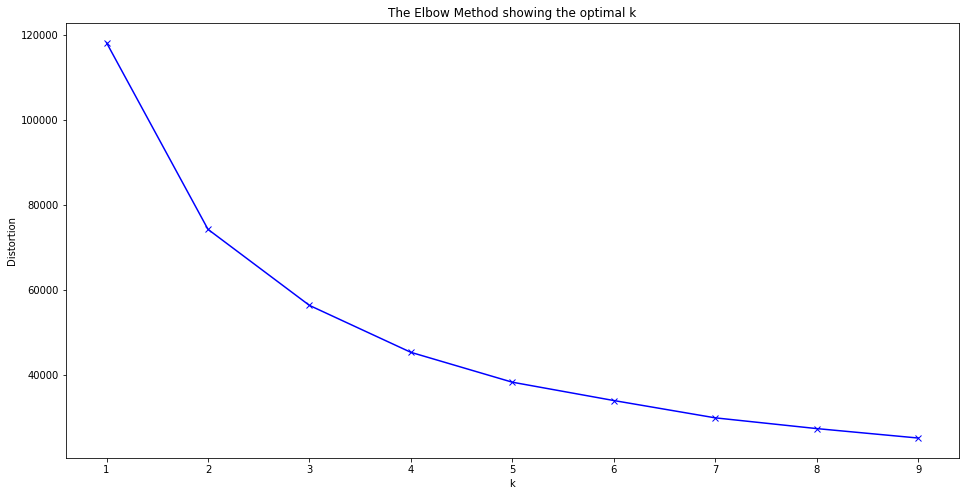

In [71]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Xpca)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [72]:
km = KMeans(n_clusters=3)

X["km"] = km.fit_predict(Xpca)



X["Cliente_ID"] = df_agencia_aux_out.Cliente_ID

In [73]:
display(X.groupby(["km"]).mean())

,Demanda_uni_equil_mean,Dev_proxima_mean,Dev_uni_proxima_mean,Venta_hoy_mean,Venta_uni_hoy_mean,Venta_uni_hoy-Dev_uni_proxima_mean,Demanda_uni_equil_sum,Dev_proxima_sum,Dev_uni_proxima_sum,Venta_hoy_sum,Venta_uni_hoy_sum,Venta_uni_hoy-Dev_uni_proxima_sum,Demanda_uni_equil_std,Dev_proxima_std,Dev_uni_proxima_std,Venta_hoy_std,Venta_uni_hoy_std,Venta_uni_hoy-Dev_uni_proxima_std,Cliente_ID
km,,,,,,,,,,,,,,,,,,,
0,-0.387219,-0.395754,-0.389815,-0.324974,-0.401579,-0.379869,-0.420197,-0.447250,-0.446749,-0.396944,-0.423290,-0.418619,-0.429019,-0.439542,-0.426167,-0.360146,-0.427956,-0.435021,2.090841e+06
1,1.283750,-0.108934,-0.107442,1.035410,1.281844,1.284876,1.300254,0.440074,0.420506,1.216151,1.298293,1.301321,1.239227,0.108368,0.089601,1.059177,1.239934,1.236295,1.543290e+06
2,-0.309968,1.692215,1.667022,-0.200789,-0.251458,-0.340125,-0.205120,1.116168,1.141887,-0.176595,-0.190329,-0.212763,-0.084553,1.555181,1.529730,-0.097687,-0.089681,-0.057078,1.773630e+06


In [104]:
df_agencia_sample = df_candid_small[(df_candid_small.Cliente_ID.isin(X[(X.km==1)].Cliente_ID.unique())) & (df_candid_small.Agencia_ID==agencia_id_select)].reset_index(drop=True).copy()

In [105]:
df_agencia_sample

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State,Venta_uni_hoy-Dev_uni_proxima
0,3,1123,1,1001,201239,2665,4,64.00,0,0.0,4,1,MARTHA,Tostada Ondulada Tubo 30p 360g Cj MR 2665,2094 CHALCO_BM,ESTADO DE MÉXICO,4
1,3,1123,1,1001,201309,1109,3,45.03,0,0.0,3,1,EL GUERRERENSE,Pan Blanco Chico 360g BIM 1109,2094 CHALCO_BM,ESTADO DE MÉXICO,3
2,3,1123,1,1001,201309,1125,8,76.80,0,0.0,8,1,EL GUERRERENSE,Tortillinas 10p 255g TR 1125,2094 CHALCO_BM,ESTADO DE MÉXICO,8
3,3,1123,1,1001,201309,1129,4,70.40,0,0.0,4,1,EL GUERRERENSE,Tortillinas 20p 510g TR 1129,2094 CHALCO_BM,ESTADO DE MÉXICO,4
4,3,1123,1,1001,201309,1146,2,42.78,0,0.0,2,1,EL GUERRERENSE,Pan Integral 675g BIM 1146,2094 CHALCO_BM,ESTADO DE MÉXICO,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141601,8,1123,1,4425,4167275,43064,1,8.15,0,0.0,1,1,NO IDENTIFICADO,Submarinos Fresa 3p 105g SP MTA MLA 43064,2094 CHALCO_BM,ESTADO DE MÉXICO,1
141602,8,1123,1,4425,4167275,43066,1,9.63,0,0.0,1,1,NO IDENTIFICADO,Pay Pina 1p 85g MTB MLA 43066,2094 CHALCO_BM,ESTADO DE MÉXICO,1
141603,8,1123,1,4425,4167275,43285,8,42.24,0,0.0,8,1,NO IDENTIFICADO,Gansito 1p 50g MTB MLA 43285,2094 CHALCO_BM,ESTADO DE MÉXICO,8
141604,8,1123,1,4425,4609357,37058,3,22.50,0,0.0,3,1,NO IDENTIFICADO,Choco Roles 2p 80g MTA MLA 37058,2094 CHALCO_BM,ESTADO DE MÉXICO,3


In [106]:
df_agencia_sample_prod = df_agencia_sample[["Venta_uni_hoy","NombreProducto"]].groupby(["NombreProducto"]).sum().sort_values(by="Venta_uni_hoy",ascending=False)

In [107]:
ls_top3_sold = df_agencia_sample_prod.head(3).index.tolist()

In [108]:
df_agencia_sample_prod.reset_index().head(10)

,NombreProducto,Venta_uni_hoy
0,Nito 1p 62g BIM 1278,74778
1,Rebanada 2p 55g BIM 1284,58843
2,Polvoroncitos Panera 40p 16 25g TR 45143,31465
3,Donas Azucar 4p 105g BIM 1250,28158
4,Gansito 1p 50g MTB MLA 43285,27557
5,Madalenas 3p 93g BIM 35651,23705
6,Mantecadas Vainilla 4p 125g BIM 1240,23640
7,Pan Blanco 640g BIM 2233,18679
8,Donitas Espolvoreadas 6p 105g BIM 1242,17509
9,Pan Molido 210g BIM 46772,13015


In [109]:
px.pie(data_frame=df_agencia_sample_prod.reset_index().head(10),values="Venta_uni_hoy",names='NombreProducto')

### Forecast top3 sold productos 

In [110]:
ls_top3_sold

['Nito 1p 62g BIM 1278',
 'Rebanada 2p 55g BIM 1284',
 'Polvoroncitos Panera 40p 16 25g TR 45143']

In [111]:
df_candid_small_prod = df_candid_small[df_candid_small.NombreProducto.isin(ls_top3_sold)].copy().reset_index(drop=True)

In [112]:
df_candid_small_prod.shape

(528112, 17)

In [113]:
df_candid_small_prod.Producto_ID.unique()

array([ 1278,  1284, 45143])

In [114]:
df_candid_small_prod

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State,Venta_uni_hoy-Dev_uni_proxima
0,3,1111,1,1101,49897,1278,15,67.50,0,0.0,15,1,ROMAN,Nito 1p 62g BIM 1278,2002 AG. AZCAPOTZALCO,"MÉXICO, D.F.",15
1,3,1111,1,1101,49958,1278,8,36.00,0,0.0,8,1,LA LUPITA,Nito 1p 62g BIM 1278,2002 AG. AZCAPOTZALCO,"MÉXICO, D.F.",8
2,3,1111,1,1101,49958,1284,10,30.20,0,0.0,10,1,LA LUPITA,Rebanada 2p 55g BIM 1284,2002 AG. AZCAPOTZALCO,"MÉXICO, D.F.",10
3,3,1111,1,1101,49983,1278,15,67.50,0,0.0,15,1,BARVEL,Nito 1p 62g BIM 1278,2002 AG. AZCAPOTZALCO,"MÉXICO, D.F.",15
4,3,1111,1,1101,49983,1284,25,75.50,0,0.0,25,1,BARVEL,Rebanada 2p 55g BIM 1284,2002 AG. AZCAPOTZALCO,"MÉXICO, D.F.",25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528107,8,1165,7,3340,2385851,1284,5,15.10,0,0.0,5,1,ESCUELA TECNOLOGICO DE COMPUINGLES SC,Rebanada 2p 55g BIM 1284,2010 AG. LOS REYES,ESTADO DE MÉXICO,5
528108,8,1165,7,3340,4250454,1284,5,15.10,0,0.0,5,1,NO IDENTIFICADO,Rebanada 2p 55g BIM 1284,2010 AG. LOS REYES,ESTADO DE MÉXICO,5
528109,8,1165,7,3340,4302603,1284,20,60.40,0,0.0,20,1,NO IDENTIFICADO,Rebanada 2p 55g BIM 1284,2010 AG. LOS REYES,ESTADO DE MÉXICO,20
528110,8,1165,7,3340,4636652,1284,3,9.06,0,0.0,3,1,NO IDENTIFICADO,Rebanada 2p 55g BIM 1284,2010 AG. LOS REYES,ESTADO DE MÉXICO,3


In [115]:
df_candid_small.shape

(7974418, 17)

#### Converting discrete variables in dummy variables to get continuos variables

In [116]:
for col in ls_cat:
    print(col,len(df_candid_small_prod[col].unique()))

Semana 6
Agencia_ID 24
Canal_ID 5
Ruta_SAK 311
Cliente_ID 67586
Producto_ID 3
NombreCliente 20597
NombreProducto 3
Town 21
State 3


In [117]:
df_candid_small_prod = df_candid_small_prod.rename(columns={"Venta_uni_hoy-Dev_uni_proxima":"Demanda"})

In [118]:
#df_candid_small_prod = df_candid_small_prod.groupby(["Agencia_ID","Canal_ID","Ruta_SAK","Town","State"]).mean().reset_index()

In [119]:
df_dumm_agenciaid = pd.get_dummies(df_candid_small_prod["Agencia_ID"])
df_dumm_agenciaid.columns = ['Agencia_ID_'+str(x) for x in df_dumm_agenciaid.columns]
df_dumm_canalid = pd.get_dummies(df_candid_small_prod["Canal_ID"])
df_dumm_canalid.columns = ['Canal_ID_'+str(x) for x in df_dumm_canalid.columns]
df_dumm_rutasak = pd.get_dummies(df_candid_small_prod["Ruta_SAK"])
df_dumm_rutasak.columns = ['Ruta_SAK_'+str(x) for x in df_dumm_rutasak.columns]
df_dumm_town = pd.get_dummies(df_candid_small_prod["Town"])
df_dumm_town.columns = ['Town_'+x for x in df_dumm_town.columns]
df_dumm_state = pd.get_dummies(df_candid_small_prod["State"])
df_dumm_state.columns = ['State_'+x for x in df_dumm_state.columns]
#df_dumm_clienteid = pd.get_dummies(df_candid_small_prod["Cliente_ID"])
#df_dumm_clienteid.columns = ['State_'+x for x in df_dumm_clienteid.columns]

In [120]:
df_candid_small_prod = df_dumm_agenciaid.join([df_dumm_canalid,df_dumm_rutasak,df_dumm_town,df_dumm_state,df_candid_small_prod[["Demanda"]]])

In [121]:
df_candid_small_prod.shape

(528112, 365)

In [91]:
df_aux = df_candid_small_prod.groupby([x for x in df_candid_small_prod.columns if x!="Demanda"]).mean()

,Agencia_ID_1110,Agencia_ID_1111,Agencia_ID_1112,Agencia_ID_1113,Agencia_ID_1116,Agencia_ID_1117,Agencia_ID_1118,Agencia_ID_1119,Agencia_ID_1120,Agencia_ID_1121,Agencia_ID_1122,Agencia_ID_1123,Agencia_ID_1124,Agencia_ID_1126,Agencia_ID_1127,Agencia_ID_1130,Agencia_ID_1137,Agencia_ID_1138,Agencia_ID_1139,Agencia_ID_1140,Agencia_ID_1143,Agencia_ID_1146,Agencia_ID_1147,Agencia_ID_1150,Agencia_ID_1152,Agencia_ID_1153,Agencia_ID_1155,Agencia_ID_1159,Agencia_ID_1164,Agencia_ID_1165,Agencia_ID_1170,Agencia_ID_1171,Agencia_ID_1172,Agencia_ID_1173,Canal_ID_1,Canal_ID_4,Canal_ID_6,Canal_ID_7,Canal_ID_8,Canal_ID_11,Ruta_SAK_1101,Ruta_SAK_1102,Ruta_SAK_1103,Ruta_SAK_1104,Ruta_SAK_1105,Ruta_SAK_1106,Ruta_SAK_1107,Ruta_SAK_1108,Ruta_SAK_1109,Ruta_SAK_1110,...,Ruta_SAK_6613,Ruta_SAK_6614,Ruta_SAK_6615,Ruta_SAK_6616,Ruta_SAK_6617,Ruta_SAK_6618,Ruta_SAK_6619,Ruta_SAK_6620,Ruta_SAK_6621,Ruta_SAK_6622,Ruta_SAK_6623,Ruta_SAK_6624,Ruta_SAK_6625,Ruta_SAK_6626,Ruta_SAK_6627,Ruta_SAK_6628,Ruta_SAK_6629,Ruta_SAK_6630,Ruta_SAK_6631,Ruta_SAK_6632,Ruta_SAK_6633,Ruta_SAK_6634,Ruta_SAK_6635,Ruta_SAK_6636,Ruta_SAK_6637,Town_2001 AG. ATIZAPAN,Town_2002 AG. AZCAPOTZALCO,Town_2003 AG. COACALCO,Town_2004 AG. CUAUTITLAN,Town_2007 AG. LA VILLA,Town_2008 AG. LAGO FILT,Town_2010 AG. LOS REYES,Town_2011 AG. SAN ANTONIO,Town_2013 AG. MEGA NAUCALPAN,Town_2014 AG. NEZA,Town_2015 AG. ROJO GOMEZ,Town_2016 AG. SAN LORENZO,Town_2017 AG. SANTA CLARA,Town_2018 AG. TEPALCATES 2,Town_2019 AG. XALOSTOC,Town_2021 AG. XOCHIMILCO 2,Town_2048 AG. IXTAPALUCA 1,Town_2078 AG. TEXCOCO,Town_2087 AG. TIZAYUCA,Town_2088 AG. CEYLAN,Town_2094 CHALCO_BM,State_ESTADO DE MÉXICO,State_HIDALGO,"State_MÉXICO, D.F.",Demanda
count,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,...,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000
mean,0.020178,0.029056,0.020178,0.014528,0.052462,0.049233,0.039548,0.046812,0.028249,0.032284,0.050847,0.059726,0.065375,0.062147,0.031477,0.033898,0.032284,0.021792,0.021792,0.058918,0.020985,0.012914,0.009685,0.029863,0.016949,0.079903,0.008071,0.006457,0.009685,0.012914,0.006457,0.002421,0.005650,0.007264,0.808717,0.105730,0.025827,0.046005,0.004036,0.009685,0.002421,0.001614,0.001614,0.000807,0.000807,0.000807,0.000807,0.000807,0.001614,0.000807,...,0.002421,0.002421,0.002421,0.002421,0.001614,0.001614,0.001614,0.001614,0.001614,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.058111,0.029056,0.049233,0.033091,0.039548,0.051655,0.046812,0.088781,0.068604,0.032284,0.021792,0.032284,0.062147,0.028249,0.050847,0.065375,0.009685,0.058918,0.079903,0.033898,0.059726,0.529459,0.079903,0.390638,14.118082
std,0.140664,0.168030,0.140664,0.119701,0.223046,0.216442,0.194973,0.211321,0.165749,0.176825,0.219775,0.237073,0.247287,0.241520,0.174673,0.181041,0.176825,0.146062,0.146062,0.235567,0.143391,0.112

In [92]:
df_candid_small["Venta_uni_hoy-Dev_uni_proxima"].describe()

count    7.974418e+06
mean     7.430178e+00
std      2.209538e+01
min     -3.360000e+03
25%      2.000000e+00
50%      4.000000e+00
75%      7.000000e+00
max      4.732000e+03
Name: Venta_uni_hoy-Dev_uni_proxima, dtype: float64

In [116]:
fig = px.histogram(df_candid_small_prod.Demanda)
fig.update_layout(title="Histograma demanda")
fig.show()
fig = px.line(y=df_candid_small_prod.Demanda)
#fig.update_layout(title="Histograma demanda")
fig.show()

In [100]:
df_candid_small_prod.corr()

,Agencia_ID_1110,Agencia_ID_1111,Agencia_ID_1112,Agencia_ID_1113,Agencia_ID_1116,Agencia_ID_1117,Agencia_ID_1118,Agencia_ID_1119,Agencia_ID_1120,Agencia_ID_1121,Agencia_ID_1122,Agencia_ID_1123,Agencia_ID_1124,Agencia_ID_1126,Agencia_ID_1127,Agencia_ID_1130,Agencia_ID_1137,Agencia_ID_1138,Agencia_ID_1139,Agencia_ID_1140,Agencia_ID_1143,Agencia_ID_1153,Agencia_ID_1164,Agencia_ID_1165,Canal_ID_1,Canal_ID_6,Canal_ID_7,Canal_ID_8,Canal_ID_11,Ruta_SAK_1101,Ruta_SAK_1102,Ruta_SAK_1103,Ruta_SAK_1104,Ruta_SAK_1105,Ruta_SAK_1106,Ruta_SAK_1107,Ruta_SAK_1108,Ruta_SAK_1109,Ruta_SAK_1110,Ruta_SAK_1111,Ruta_SAK_1112,Ruta_SAK_1113,Ruta_SAK_1114,Ruta_SAK_1115,Ruta_SAK_1116,Ruta_SAK_1117,Ruta_SAK_1118,Ruta_SAK_1119,Ruta_SAK_1120,Ruta_SAK_1121,...,Ruta_SAK_1636,Ruta_SAK_1637,Ruta_SAK_1638,Ruta_SAK_1639,Ruta_SAK_1640,Ruta_SAK_1641,Ruta_SAK_1642,Ruta_SAK_1643,Ruta_SAK_1644,Ruta_SAK_1645,Ruta_SAK_2812,Ruta_SAK_3204,Ruta_SAK_3215,Ruta_SAK_3239,Ruta_SAK_3306,Ruta_SAK_3320,Ruta_SAK_3330,Ruta_SAK_3332,Ruta_SAK_3334,Ruta_SAK_3335,Ruta_SAK_3339,Ruta_SAK_3340,Ruta_SAK_3401,Ruta_SAK_3503,Ruta_SAK_4501,Town_2001 AG. ATIZAPAN,Town_2002 AG. AZCAPOTZALCO,Town_2003 AG. COACALCO,Town_2004 AG. CUAUTITLAN,Town_2007 AG. LA VILLA,Town_2008 AG. LAGO FILT,Town_2010 AG. LOS REYES,Town_2011 AG. SAN ANTONIO,Town_2013 AG. MEGA NAUCALPAN,Town_2014 AG. NEZA,Town_2015 AG. ROJO GOMEZ,Town_2016 AG. SAN LORENZO,Town_2017 AG. SANTA CLARA,Town_2018 AG. TEPALCATES 2,Town_2019 AG. XALOSTOC,Town_2021 AG. XOCHIMILCO 2,Town_2048 AG. IXTAPALUCA 1,Town_2078 AG. TEXCOCO,Town_2087 AG. TIZAYUCA,Town_2088 AG. CEYLAN,Town_2094 CHALCO_BM,State_ESTADO DE MÉXICO,State_HIDALGO,"State_MÉXICO, D.F.",Demanda
Agencia_ID_1110,1.000000,-0.005977,-0.004867,-0.004141,-0.007619,-0.007619,-0.005628,-0.006146,-0.005977,-0.006256,-0.006419,-0.007989,-0.008124,-0.007138,-0.005001,-0.006472,-0.006365,-0.005131,-0.001116,-0.007712,-0.001116,-0.008780,-0.000789,-0.002092,-0.276035,-0.001367,0.352576,-0.000789,-0.000789,-0.001367,-0.001116,-0.001116,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.001116,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.001116,-0.000789,-0.000789,-0.000789,-0.001116,-0.001116,...,-0.001367,-0.001116,-0.000789,-0.001116,-0.001367,-0.001116,-0.001116,-0.001116,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,1.000000,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.001579,-0.007619,-0.005977,-0.005001,-0.004867,-0.005628,0.186959,-0.006837,-0.007619,-0.006256,-0.006365,-0.005131,-0.006256,-0.007138,-0.005977,-0.006419,-0.008124,-0.000789,-0.007712,-0.008780,-0.001116,-0.007989,-0.030222,-0.008780,0.036308,-0.047756
Agencia_ID_1111,-0.005977,1.000000,-0.036887,-0.031383,-0.057746,-0.057746,-0.042657,-0.046582,-0.045305,-0.047417,-0.048648,-0.060548,-0.061575,-0.054098,-0.037901,-0.049053,-0.048241,-0.038892,-0.008457,-0.058456,-0.008457,-0.066548,-0.005977,-0.015852,0.021655,-0.010361,-0.016954,-0.005977,-0.005977,0.069327,-0.008457,-0.008457,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,0.089102,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.008457,-0.005977,-0.005977,-0.005977,-0.008457,-0.008457,...,-0.010361,-0.008457,-0.005977,-0.008457,0.069327,0.089102,0.089102,0.089102,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,0.057070,-0.057746,1.000000,-0.037901,-0.036887,-0.042657,-0.031972,-0.051817,-0.057746,-0.047417,-0.048241,-0.038892,-0.047417,-0.054098,-0.045305,-0.048648,-0.061575,-0.005977,-0.058456,-0.066548,-0.008457,-0.060548,-0.229064,-0.066548,0.275192,-0.030844
Agencia_ID_1112,-0.004867,-0.036887,1.000000,-0.025552,-0.047016,-0.047016,-0.034731,-0.037926,-0.036887,-0.038606,-0.039609,-0.049297,-0.050134,-0.044046,-0.030859,-0.039939,-0.039277,-0.031666,-0.006885,-0.047594,-0.006885,-0.054182,-0.004867,-0.012907,0.017631,-0.008436,-0.013803,-0.004867,-0.004867,-0.0084